In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress

In [2]:
df=pd.read_csv('Rainfall values without -99.9 values.csv')
print(df)

                      Date  Day  Month  Year  Rainfall..mm.
0               1877-07-01    1      7  1877            0.0
1               1877-07-18   18      7  1877            0.0
2               1877-07-19   19      7  1877            0.0
3               1877-07-22   22      7  1877            0.0
4               1877-07-23   23      7  1877            0.0
...                    ...  ...    ...   ...            ...
16358  1914-11-10 00:00:00   10     11  1914           86.4
16359  1919-12-02 00:00:00    2     12  1919           96.8
16360  1903-06-02 00:00:00    2      6  1903           99.8
16361           1895-11-04    4     11  1895          102.4
16362           1893-03-10   10      3  1893          119.6

[16363 rows x 5 columns]


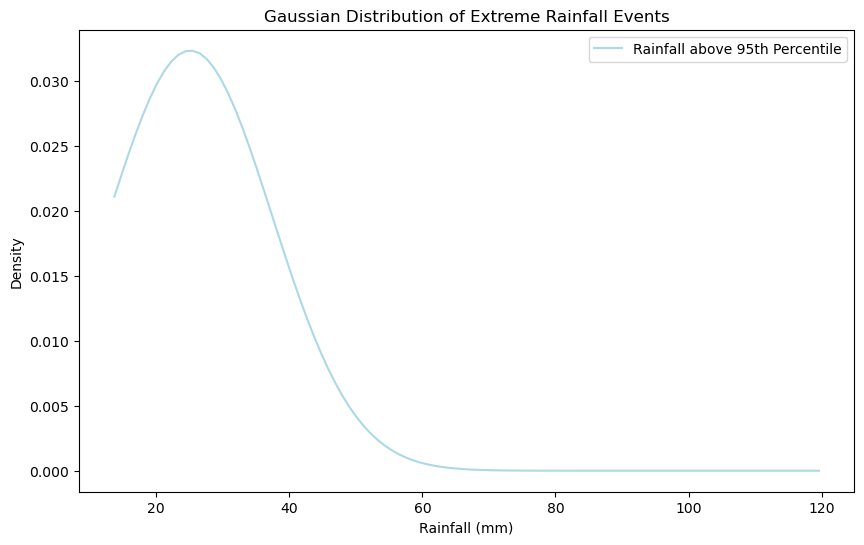

Very Wet Day Precipitation (Daily precipitation > 95th percentile):
      Date  Rainfall..mm.
1878-11-05           13.7
1884-06-27           13.7
1884-10-31           13.7
1886-09-27           13.7
1887-01-19           13.7
1887-02-18           13.7
1889-04-18           13.7
1890-02-20           13.7
1890-06-29           13.7
1892-12-27           13.7
1896-11-26           13.7
1897-01-03           13.7
1898-12-20           13.7
1900-05-18           13.7
1905-07-10           13.7
1913-03-28           13.7
1913-06-22           13.7
1913-09-20           13.7
1920-10-14           13.7
1879-09-19           14.0
1883-09-13           14.0
1884-06-11           14.0
1884-07-04           14.0
1886-12-31           14.0
1889-06-02           14.0
1892-09-12           14.0
1894-03-08           14.0
1901-09-25           14.0
1903-04-26           14.0
1905-10-17           14.0
1906-10-04           14.0
1911-02-13           14.0
1915-10-15           14.0
1916-04-11           14.0
1879-01-26           1

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Assuming df is already loaded with the correct data, as shown in your code
# Exclude the years 1877 and 1922
df = df[(df['Year'] != 1877) & (df['Year'] != 1922)]

# Calculate the 95th and 99th percentiles for daily precipitation
percentile_95 = np.percentile(df['Rainfall..mm.'], 95)
percentile_99 = np.percentile(df['Rainfall..mm.'], 99)

# Filter for Very Wet Day and Extremely Wet Day Precipitation
very_wet_days = df[df['Rainfall..mm.'] > percentile_95]
extremely_wet_days = df[df['Rainfall..mm.'] > percentile_99]

# Plot Gaussian distribution for each category
def plot_gaussian(data, color, label):
    mean_val = np.mean(data)
    std_val = np.std(data)
    x = np.linspace(min(data), max(data), 100)
    y = norm.pdf(x, mean_val, std_val)
    plt.plot(x, y, color=color, label=label)
    
plt.figure(figsize=(10, 6))
plot_gaussian(very_wet_days['Rainfall..mm.'], 'lightblue', 'Rainfall above 95th Percentile')
#plot_gaussian(extremely_wet_days['Rainfall..mm.'], 'darkblue', 'Rainfall above 99th Percentile')

plt.title('Gaussian Distribution of Extreme Rainfall Events')
plt.xlabel('Rainfall (mm)')
plt.ylabel('Density')
plt.legend()
plt.show()

# Print dates and rainfall values for Very Wet and Extremely Wet Days
print("Very Wet Day Precipitation (Daily precipitation > 95th percentile):")
print(very_wet_days[['Date', 'Rainfall..mm.']].to_string(index=False))

print("\nExtremely Wet Day Precipitation (Daily precipitation > 99th percentile):")
print(extremely_wet_days[['Date', 'Rainfall..mm.']].to_string(index=False))


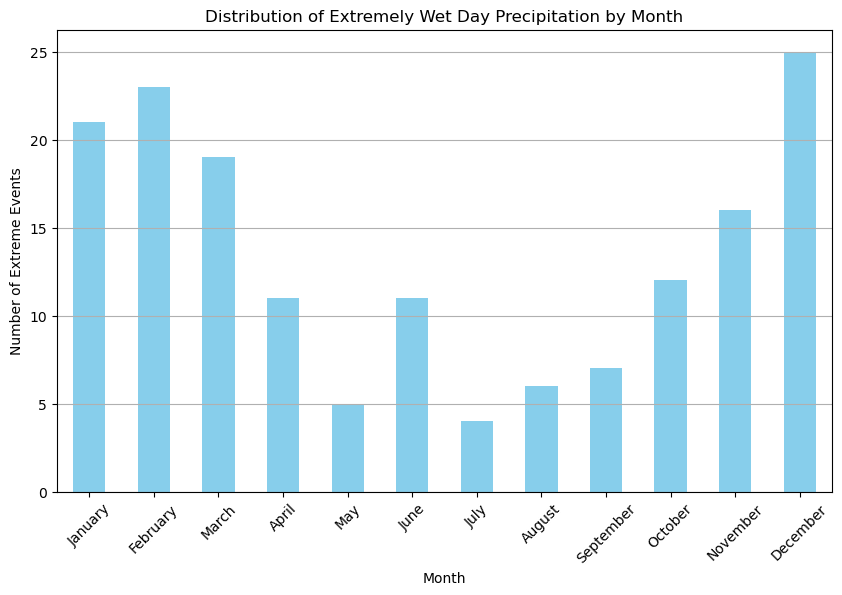

In [5]:
# Ensure 'Date' is in datetime format and extract 'Month' if it's not already a column
if 'Month' not in extremely_wet_days.columns:
    extremely_wet_days['Date'] = pd.to_datetime(extremely_wet_days['Date'])
    extremely_wet_days['Month'] = extremely_wet_days['Date'].dt.month

# Count the number of extremely wet days by month
monthly_extreme_events = extremely_wet_days['Month'].value_counts().sort_index()

# Convert month numbers to month names for readability
month_names = {1: 'January', 2: 'February', 3: 'March', 4: 'April', 5: 'May', 6: 'June',
               7: 'July', 8: 'August', 9: 'September', 10: 'October', 11: 'November', 12: 'December'}
monthly_extreme_events.index = monthly_extreme_events.index.map(month_names)

# Plot the distribution
plt.figure(figsize=(10, 6))
monthly_extreme_events.plot(kind='bar', color='skyblue')
plt.title('Distribution of Extremely Wet Day Precipitation by Month')
plt.xlabel('Month')
plt.ylabel('Number of Extreme Events')
plt.xticks(rotation=45)
plt.grid(axis='y')

plt.show()


In [44]:
# Assuming 'extremely_wet_days' DataFrame is already prepared as shown above
# Ensure 'Date' is in datetime format for filtering
extremely_wet_days['Date'] = pd.to_datetime(extremely_wet_days['Date'])

# Extract the month information for filtering
extremely_wet_days['Month'] = extremely_wet_days['Date'].dt.month

# Filter for December, January, and February (months 12, 1, and 2)
winter_extreme_wet_days = extremely_wet_days[extremely_wet_days['Month'].isin([12, 1, 2])]

# Print the filtered data
print("Extremely Wet Days in December, January, and February:")
print(winter_extreme_wet_days[['Date', 'Rainfall..mm.']].sort_values(by='Date').to_string(index=False))


Extremely Wet Days in December, January, and February:
      Date  Rainfall..mm.
1878-02-09           36.8
1878-02-11           67.3
1878-02-23           75.4
1878-12-26           32.3
1879-02-02           62.0
1879-02-16           38.9
1879-12-28           35.8
1880-02-22           35.6
1880-02-23           38.6
1881-01-29           34.3
1882-02-07           55.4
1883-02-10           39.4
1883-12-05           41.7
1885-02-17           35.8
1885-12-06           35.6
1885-12-09           41.9
1887-12-26           33.0
1889-01-21           31.8
1889-12-19           36.3
1890-01-13           83.6
1890-01-17           45.0
1890-12-23           39.4
1891-01-11           33.8
1891-01-14           74.7
1891-12-03           37.3
1892-12-28           35.6
1893-02-12           39.4
1893-02-13           36.8
1894-01-06           56.4
1895-01-19           66.8
1895-01-28           35.8
1895-12-11           32.0
1895-12-30           31.8
1896-01-26           64.8
1896-12-07           39.1
1896-12-1

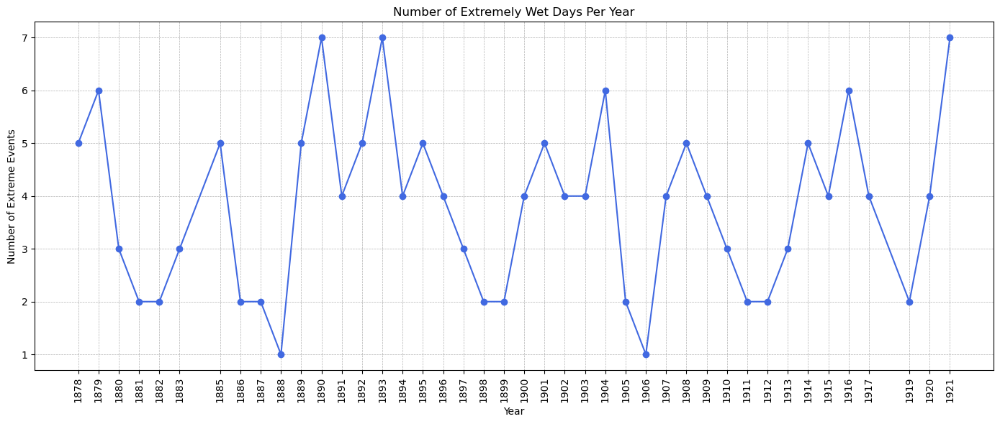

In [6]:
# Ensure 'Year' is a column if not already present
if 'Year' not in extremely_wet_days.columns:
    extremely_wet_days['Year'] = extremely_wet_days['Date'].dt.year

# Count the number of extremely wet days by year
yearly_extreme_events = extremely_wet_days.groupby('Year').size()

plt.figure(figsize=(14, 6))

# Plot line graph for yearly data
plt.plot(yearly_extreme_events.index, yearly_extreme_events.values, marker='o', linestyle='-', color='royalblue')

# Set x-ticks to show every year, ensuring 'Year' is treated as integer for x-axis labels
plt.xticks(yearly_extreme_events.index.astype(int), rotation=90)

# Adding titles and labels
plt.title('Number of Extremely Wet Days Per Year')
plt.xlabel('Year')
plt.ylabel('Number of Extreme Events')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame loaded from the 'Rainfall values without -99.9 values.csv' file
df = pd.read_csv('Rainfall values without -99.9 values.csv')

# Ensure 'Date' is in datetime format
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month

# Exclude the years 1877 and 1922
df = df[(df['Year'] != 1877) & (df['Year'] != 1922)]

# Define wet (≥ 1 mm) and dry days (< 1 mm)
df['Wet_Day'] = df['Rainfall..mm.'] >= 1

# Identify consecutive dry and wet days
df['Group'] = (df['Wet_Day'] != df['Wet_Day'].shift()).cumsum()
consecutive_stats = df.groupby(['Group', 'Wet_Day']).agg(
    start_date=('Date', 'min'),
    end_date=('Date', 'max'),
    duration=('Date', 'count')
).reset_index()

# Determine the maximum duration for dry and wet periods
max_dry_period = consecutive_stats[consecutive_stats['Wet_Day'] == False]['duration'].max()
max_wet_period = consecutive_stats[consecutive_stats['Wet_Day'] == True]['duration'].max()

print(f"Maximum Consecutive Dry Days: {max_dry_period}")
print(f"Maximum Consecutive Wet Days: {max_wet_period}")


Maximum Consecutive Dry Days: 12165
Maximum Consecutive Wet Days: 3858


In [8]:
# Ensure the DataFrame 'df' has the necessary columns and data
df['Dry_Day'] = df['Rainfall..mm.'] < 1

# Mark changes between dry and wet days to identify consecutive sequences
df['Change'] = df['Dry_Day'] != df['Dry_Day'].shift(1)
df['Group'] = df['Change'].cumsum()

# Calculate the length of each dry and wet period
period_lengths = df.groupby(['Year', 'Group', 'Dry_Day']).size().reset_index(name='Length')


# Find the maximum consecutive dry and wet days for each year
max_dry_days_yearly = period_lengths[period_lengths['Dry_Day'] == True].groupby('Year')['Length'].max()
max_wet_days_yearly = period_lengths[period_lengths['Dry_Day'] == False].groupby('Year')['Length'].max()

# Print results
print("Maximum Consecutive Dry Days by Year:")
print(max_dry_days_yearly)
print("\nMaximum Consecutive Wet Days by Year:")
print(max_wet_days_yearly)



Maximum Consecutive Dry Days by Year:
Year
1878    271
1879    239
1880    290
1881    296
1882    274
1883    271
1884    288
1885    285
1886    269
1887    247
1888    314
1889    257
1890    237
1891    260
1892    262
1893    262
1894    258
1895    289
1896    269
1897    291
1898    296
1899    286
1900    271
1901    284
1902    302
1903    283
1904    281
1905    279
1906    278
1907    264
1908    283
1909    279
1910    279
1911    268
1912    289
1913    292
1914    279
1915    285
1916    256
1917    277
1918    301
1919    298
1920    269
1921    257
Name: Length, dtype: int64

Maximum Consecutive Wet Days by Year:
Year
1878     93
1879    126
1880     76
1881     69
1882     91
1883     94
1884     77
1885     78
1886     95
1887    116
1888     50
1889    108
1890    127
1891    104
1892    103
1893    103
1894    106
1895     74
1896     94
1897     74
1898     68
1899     79
1900     93
1901     79
1902     63
1903     81
1904     85
1905     85
1906     87
1907    10

In [23]:
import pandas as pd

# Assuming 'df' has already been loaded
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year

# Exclude specific years and rainfall values
df = df[(df['Year'] != 1877) & (df['Year'] != 1922) & (df['Rainfall..mm.'] != -99.9)]

consecutive_dry_periods = []
start_date, previous_date = None, None

# Iterate over the DataFrame
for i, row in df.sort_values('Date').iterrows():
    if row['Rainfall..mm.'] < 1:
        if start_date is None:
            start_date = row['Date']
        previous_date = row['Date']
    else:
        if start_date is not None:
            consecutive_dry_periods.append((start_date, previous_date))
            start_date = None

if start_date is not None:
    consecutive_dry_periods.append((start_date, previous_date))

    # Specify the path to your CSV file
file_path = r'C:\Users\manda\Documents\Master thesis Data\Data file (1877-1922 transcribed data) (1).csv'


# Try different encodings until you find the right one
encodings = ['utf-8', 'latin1', 'utf-16']

for encoding in encodings:
    try:
        # Read the CSV file into a pandas DataFrame
        remarks_df = pd.read_csv(file_path, encoding=encoding)
        # Display the DataFrame
        print(remarks_df)
        break
    except UnicodeDecodeError:
        print(f"Failed to decode using encoding: {encoding}")

# Load the remarks data
remarks_df = pd.read_csv(file_path, encoding='latin-1')  # Adjust encoding and file_path as necessary
remarks_df['Date'] = pd.to_datetime(remarks_df['Date'])

# Filter remarks_df to exclude specific conditions
remarks_df = remarks_df[(remarks_df['Year'] != 1877) & (remarks_df['Year'] != 1922) & (remarks_df['Remarks'] != '-99.9')]

for i, (start_date, end_date) in enumerate(consecutive_dry_periods, start=1):
    total_rainfall = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]['Rainfall..mm.'].sum()
    remarks_within_period = remarks_df[(remarks_df['Date'] >= start_date) & (remarks_df['Date'] <= end_date)]['Remarks']
    joined_remarks = "; ".join(remarks_within_period) if not remarks_within_period.empty else "No remarks"
    
    print(f"Consecutive Dry Period {i}:")
    print(f"Start Date: {start_date.date()}, End Date: {end_date.date()}")
    print(f"Total Rainfall: {total_rainfall} mm")
    print(f"Remarks: {joined_remarks}\n")


Failed to decode using encoding: utf-8
             Date  Day  Month  Year  Attached.Thermometer..C.  \
0      1877-01-01    1      1  1877                     -99.9   
1      1877-01-02    2      1  1877                     -99.9   
2      1877-01-03    3      1  1877                     -99.9   
3      1877-01-04    4      1  1877                     -99.9   
4      1877-01-05    5      1  1877                     -99.9   
...           ...  ...    ...   ...                       ...   
16611  26/06/1922   26      6  1922                      11.7   
16612  27/06/1922   27      6  1922                      11.7   
16613  28/06/1922   28      6  1922                      10.0   
16614  29/06/1922   29      6  1922                       7.2   
16615  30/06/1922   30      6  1922                       7.2   

       Sea.Level.Pressure..hPa.  Dry.Bulb.Temp..C.  Wet.Bulb.Temp..C.  \
0                        -99.90              -99.9              -99.9   
1                        -99.90   

C:\Users\manda\AppData\Local\Temp\ipykernel_12688\1127137729.py:46: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  remarks_df['Date'] = pd.to_datetime(remarks_df['Date'])


Consecutive Dry Period 1:
Start Date: 1878-01-01, End Date: 1878-01-13
Total Rainfall: 0.5 mm
Remarks: Fine with cumulus; Much Cloud; Cloudy; Cloudy. A little drizzle; Cloudy. Clearing in middle day; Fine with few clouds; do; Cloudless; Fine. Cirrus forming in middle day; Fine + hot with few clouds; do; Cloudy. T storm at 2 pm very high with few drops of rain only.; Cloudy T storms with much lightning in aft.

Consecutive Dry Period 2:
Start Date: 1878-01-15, End Date: 1878-01-18
Total Rainfall: 0.0 mm
Remarks: Fine. Cumulus in middle day; Fine and hot wind E with cloud at 5 pm; Fine and hot with detached clouds. Wind changed to E at 5 pm; T storm from SE at 5 pm

Consecutive Dry Period 3:
Start Date: 1878-01-20, End Date: 1878-01-21
Total Rainfall: 0.0 mm
Remarks: Cloudy. Wind SE at 6 pm; High wind with thunder and slight rain in aft.

Consecutive Dry Period 4:
Start Date: 1878-01-24, End Date: 1878-02-05
Total Rainfall: 1.9000000000000001 mm
Remarks: Fine with drifting clouds. Drizzl

Consecutive Dry Period 55:
Start Date: 1879-03-02, End Date: 1879-03-03
Total Rainfall: 0.0 mm
Remarks: Fine. Small clouds scud from E covering sky at sunset; upper clouds from W. Much cloud and cumulus after sunset quite overcast. Showers during night and heavy rain in mg

Consecutive Dry Period 56:
Start Date: 1879-03-07, End Date: 1879-03-11
Total Rainfall: 0.0 mm
Remarks: Fine. Few small clouds; Fine; Fine with few small clounds; Fine with few clouds; forenoon fine. Thinder in aft with light rain. Raining 8-10pm

Consecutive Dry Period 57:
Start Date: 1879-03-13, End Date: 1879-03-15
Total Rainfall: 0.3 mm
Remarks: Fine. Cloud forming. Signs of W wind. Disturbance in upper currents; Threatening Much small cumulus in W with dense cissus above.light rain at 8am; Showery rain heavier 8-10pm and throughout night. Creek in flood

Consecutive Dry Period 58:
Start Date: 1879-03-19, End Date: 1879-03-30
Total Rainfall: 0.9 mm
Remarks: Fine with few clouds; Fine. Cold. Few clouds; 8am drizz

Consecutive Dry Period 108:
Start Date: 1879-12-30, End Date: 1880-01-08
Total Rainfall: 0.0 mm
Remarks: Fine; Fine with lightning to W at night; Fine; Cloudless; Fine. Thunder to SW in aft. Much lightning to W at night.; Fine. Light Tstorm to SW in aft.; Tstorm formed and went off to SE in evg. Warm close night; Tstorem at 2pm with few drops of rain - heat off to SE like heavy storm; Fine. Much cloud in middle day wind E; cloud forming in 3 layers light rain at night - heavy before morning

Consecutive Dry Period 109:
Start Date: 1880-01-10, End Date: 1880-01-30
Total Rainfall: 0.8 mm
Remarks: Fine good deal of cloud; Fine; Fine; Fine and clear; Cloudless warm; Fine. Cumulus forming in aft.; Fine wind light from all quarters. Much cumulus in middle day; much cumulus. Thunder and lightning in evg.; Fine and clear. Tstorm to W at night.; Fine; Cloudless; Fine and clear; Fine few clouds in aft.; Fine with small hard clouds and signs of change to W. Wind NE; Fine m uch cloud in aft. Wind 

Consecutive Dry Period 160:
Start Date: 1881-01-30, End Date: 1881-02-04
Total Rainfall: 0.0 mm
Remarks: Fine. Tstorm on S at 6pm.; Fine. Tstorm passed on S in aft.; Fine. Thunder all round in aft.; Fine. wind E at sunset.; Fine. wind E at sunset.; much cloud like rain. Rain before 6 am

Consecutive Dry Period 161:
Start Date: 1881-02-08, End Date: 1881-02-25
Total Rainfall: 0.0 mm
Remarks: Fine few light showers; overcast all day with strong breeze.; Fine; Fine and clear. Wind changed to W.; Cloudless and calm.; do  do. Thunder to SW at 9 am.; strong gale from E all day.; Cloudy from E.; Fine; Cloudy wind W during day.; Fine and clear.; Fine. Tstorm in aft from SE with few drops of rain.; Fine. Thunder round in aft.; do  do  do  do; Fine.; Fine. Cloud forming in aft.; Fine; Cloudy

Consecutive Dry Period 162:
Start Date: 1881-02-27, End Date: 1881-03-05
Total Rainfall: 0.0 mm
Remarks: Cloudy; Fine.; Fine.; Fine and clear.; Fine. Cumulus forming in aft.; do  do  do  do; Fine. Ts

Consecutive Dry Period 191:
Start Date: 1881-10-22, End Date: 1881-10-25
Total Rainfall: 0.0 mm
Remarks: Fine.; Cloudless; Cloudy cumuli with cirrus above; Cloudy cumuli with cirrus above and haze below

Consecutive Dry Period 192:
Start Date: 1881-10-29, End Date: 1881-11-01
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine cirrus forming and thinckening towards sunset.; Fine.; T storm with rain in aft.

Consecutive Dry Period 193:
Start Date: 1881-11-04, End Date: 1881-11-10
Total Rainfall: 0.0 mm
Remarks: Thunder with few drops of rain at 2 pm; Fine wind changed to E at sunset with thin drizzle; Fine; Fine and clear.; do  do; Cloudy shower at sunset; Cloudy. Rain in aft with little Thunder

Consecutive Dry Period 194:
Start Date: 1881-11-13, End Date: 1881-11-13
Total Rainfall: 0.0 mm
Remarks: Thunder in aft with little rain

Consecutive Dry Period 195:
Start Date: 1881-11-15, End Date: 1881-11-15
Total Rainfall: 0.0 mm
Remarks: Cloudy rain in aft.

Consecutive Dry Period 196:
S

Consecutive Dry Period 232:
Start Date: 1882-10-05, End Date: 1882-10-05
Total Rainfall: 0.0 mm
Remarks: Cloudy and sometimes drizzling rain at night

Consecutive Dry Period 233:
Start Date: 1882-10-07, End Date: 1882-10-10
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine and clear; Fine and clear; Cloudy. Rain after 8pm

Consecutive Dry Period 234:
Start Date: 1882-10-12, End Date: 1882-10-16
Total Rainfall: 0.0 mm
Remarks: Cloudy like rain. Thunder in forenoon; Cloudy like rain; Cloudy like rain; Cloudy like rain; Fine. Thunder at 7:30pm followed by rain

Consecutive Dry Period 235:
Start Date: 1882-10-18, End Date: 1882-10-19
Total Rainfall: 0.0 mm
Remarks: Dull; Fine. Rain at night

Consecutive Dry Period 236:
Start Date: 1882-10-21, End Date: 1882-10-22
Total Rainfall: 1.0 mm
Remarks: Showery at midday; Cloudy like storm. Thunder sound. T storm at 8pm with heavy rain

Consecutive Dry Period 237:
Start Date: 1882-10-25, End Date: 1882-10-25
Total Rainfall: 0.8 mm
Remarks: Thund

Consecutive Dry Period 287:
Start Date: 1883-10-05, End Date: 1883-10-06
Total Rainfall: 0.5 mm
Remarks: do; light rain heavier after sunset

Consecutive Dry Period 288:
Start Date: 1883-10-08, End Date: 1883-10-12
Total Rainfall: 0.0 mm
Remarks: Fine; do; do; do; Fine. Much cloud rain at 6am

Consecutive Dry Period 289:
Start Date: 1883-10-17, End Date: 1883-10-18
Total Rainfall: 0.0 mm
Remarks: do; Tstorm in aft with little rain

Consecutive Dry Period 290:
Start Date: 1883-10-21, End Date: 1883-10-21
Total Rainfall: 0.0 mm
Remarks: Tstorm with heavy rain in aft

Consecutive Dry Period 291:
Start Date: 1883-10-23, End Date: 1883-10-25
Total Rainfall: 0.0 mm
Remarks: do; do; Thunder all aftto SW and S. again at night with showers

Consecutive Dry Period 292:
Start Date: 1883-10-29, End Date: 1883-11-07
Total Rainfall: 0.0 mm
Remarks: Fine; Fine; do; do; do; do; Cloudy like rain. Thunder to SW; Fine; do; Tstorms in aft with rain

Consecutive Dry Period 293:
Start Date: 1883-11-12, End 

Consecutive Dry Period 340:
Start Date: 1884-11-08, End Date: 1884-11-16
Total Rainfall: 1.6 mm
Remarks: succession of small Tstorm all daywith few drops of rain; Fine; Fine; Fine; Fine. Thunder at midday; Fine. Sprinkle of rain in aft.; Fine; do; Gale all day. Rain after sunset 3 hours

Consecutive Dry Period 341:
Start Date: 1884-11-18, End Date: 1884-11-22
Total Rainfall: 0.0 mm
Remarks: do; Fine; do; do; Thunderin aft with light rain and at night

Consecutive Dry Period 342:
Start Date: 1884-11-24, End Date: 1884-11-25
Total Rainfall: 0.0 mm
Remarks: Fine much cloud; Thunder at midday with shower

Consecutive Dry Period 343:
Start Date: 1884-11-29, End Date: 1884-12-07
Total Rainfall: 0.5 mm
Remarks: Cloudy like rain; Fine; do; gale of wind and cloudy; gale blowing all day; Fine; Fine and clear; Fine; Tstorm with littlerain 2 pm

Consecutive Dry Period 344:
Start Date: 1884-12-09, End Date: 1884-12-10
Total Rainfall: 0.0 mm
Remarks: Fine. Cloud covering sky from W at 8 pm; Fine. Ts

Consecutive Dry Period 387:
Start Date: 1885-11-02, End Date: 1885-11-06
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine and clear; do; Fine; Cloudy Thunder with light showers in aft

Consecutive Dry Period 388:
Start Date: 1885-11-08, End Date: 1885-11-10
Total Rainfall: 0.0 mm
Remarks: do; Cloudy Thunder to N at 7am; Cloudy Tstorm at 6pm followed by steady rain very heavy at times

Consecutive Dry Period 389:
Start Date: 1885-11-12, End Date: 1885-11-24
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine; do; do; do; do; Cloudy Thunder in aft; Cloudy Thunder heard in aft; Thunder in aft; much cloud; Cloudy like storm; Fine; Cloudy Thunder in aft

Consecutive Dry Period 390:
Start Date: 1885-11-29, End Date: 1885-12-05
Total Rainfall: 0.0 mm
Remarks: do; Fine; Fine and clear; Fine; do; do; Tstorm at midday with heavy rain

Consecutive Dry Period 391:
Start Date: 1885-12-07, End Date: 1885-12-08
Total Rainfall: 0.0 mm
Remarks: do; Thunder in aft Tstorm at 7pm with very heavy rain

Consecutive Dry Period 435:
Start Date: 1886-10-09, End Date: 1886-10-09
Total Rainfall: 0.0 mm
Remarks: Showers with Thunder steady rain 7 pm

Consecutive Dry Period 436:
Start Date: 1886-10-13, End Date: 1886-10-13
Total Rainfall: 0.0 mm
Remarks: do Thunder in aft and in early mg with rain

Consecutive Dry Period 437:
Start Date: 1886-10-16, End Date: 1886-10-16
Total Rainfall: 0.3 mm
Remarks: Cloudy and showery

Consecutive Dry Period 438:
Start Date: 1886-10-18, End Date: 1886-10-19
Total Rainfall: 0.0 mm
Remarks: do; Cloudy rain in aft

Consecutive Dry Period 439:
Start Date: 1886-10-22, End Date: 1886-10-22
Total Rainfall: 0.0 mm
Remarks: Fine Thunder at sunset with hail

Consecutive Dry Period 440:
Start Date: 1886-10-24, End Date: 1886-11-02
Total Rainfall: 0.0 mm
Remarks: do strong gale with clouds in aft; Cloudy strong gale.; Clear sky strong gale; Fine and clear; do do; do do; Cloudy; Thunder in aft; Cloudy; Thunder with light rain rain at night

Consecutive Dry Period 441:


Consecutive Dry Period 488:
Start Date: 1887-08-05, End Date: 1887-08-10
Total Rainfall: 0.0 mm
Remarks: Fine and clear; do do; do do; do do; do do; Fine Cloud forming in aft Light rain in mg

Consecutive Dry Period 489:
Start Date: 1887-08-16, End Date: 1887-08-17
Total Rainfall: 0.0 mm
Remarks: do; do Showers in early mg

Consecutive Dry Period 490:
Start Date: 1887-08-19, End Date: 1887-08-28
Total Rainfall: 1.8 mm
Remarks: Cloudy; do; Fine; do much cloud in aft cumulus; heavy cumuli all day; do Thunder at sunset; Fine; do; Cloudy; Cloudy light showers at sunset

Consecutive Dry Period 491:
Start Date: 1887-09-04, End Date: 1887-09-06
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine cloud at sunset with shower; Stormy

Consecutive Dry Period 492:
Start Date: 1887-09-08, End Date: 1887-09-13
Total Rainfall: 0.0 mm
Remarks: Fine still ??? Hard; Fine; do; do; do; Cloudy

Consecutive Dry Period 493:
Start Date: 1887-09-15, End Date: 1887-09-21
Total Rainfall: 0.0 mm
Remarks: Fine; d

Consecutive Dry Period 544:
Start Date: 1888-12-15, End Date: 1888-12-15
Total Rainfall: 0.3 mm
Remarks: Thuinder in forenoon little rain

Consecutive Dry Period 545:
Start Date: 1888-12-17, End Date: 1888-12-19
Total Rainfall: 0.0 mm
Remarks: Cloudy; Fine; Tstrom with shower 1 pm

Consecutive Dry Period 546:
Start Date: 1888-12-21, End Date: 1888-12-25
Total Rainfall: 0.0 mm
Remarks: Fine and clear; do; do; do detached clouds; Cloudy

Consecutive Dry Period 547:
Start Date: 1888-12-27, End Date: 1889-01-03
Total Rainfall: 0.0 mm
Remarks: do; do; do; Cloudy; do; Thunder in aft with little rain; Fine; Do cloud forming in aft heavy showers in early mg

Consecutive Dry Period 548:
Start Date: 1889-01-06, End Date: 1889-01-15
Total Rainfall: 0.0 mm
Remarks: Do do; Do; Do do; Do do; Do do; Do do; Do do; Do do; Do do; Do showers at night

Consecutive Dry Period 549:
Start Date: 1889-01-18, End Date: 1889-01-20
Total Rainfall: 0.0 mm
Remarks: Cloudy; Fine; Fine terrific T storm at midnight fr

Consecutive Dry Period 624:
Start Date: 1890-03-29, End Date: 1890-03-31
Total Rainfall: 0.0 mm
Remarks: Fine; Do; Cloudy like rain in aft heavy showers after midnight

Consecutive Dry Period 625:
Start Date: 1890-04-02, End Date: 1890-04-09
Total Rainfall: 0.8 mm
Remarks: Cloudy T storm towards sunset; Fine; Do; Do; Do; Do; Do; Do rain in early mg

Consecutive Dry Period 626:
Start Date: 1890-04-13, End Date: 1890-04-22
Total Rainfall: 0.0 mm
Remarks: Do; Do; Do; Do; Do; Cloudy; Fine; Do; Do; Do Thunder 5pm with showers

Consecutive Dry Period 627:
Start Date: 1890-04-24, End Date: 1890-05-02
Total Rainfall: 0.5 mm
Remarks: Fine; Do; Do; Do; Fine; Cloudy; Fine; Do; Do shower in evg

Consecutive Dry Period 628:
Start Date: 1890-05-09, End Date: 1890-05-16
Total Rainfall: 0.0 mm
Remarks: Do; Do; Do; Do; Do; Do; Do; Do light rain 7am

Consecutive Dry Period 629:
Start Date: 1890-05-20, End Date: 1890-05-22
Total Rainfall: 0.0 mm
Remarks: Fine; Do; Do rain at 8am

Consecutive Dry Period 6

Consecutive Dry Period 705:
Start Date: 1891-09-23, End Date: 1891-09-25
Total Rainfall: 0.0 mm
Remarks: do; Fine and clear; Thunder with rain midday and aft

Consecutive Dry Period 706:
Start Date: 1891-09-30, End Date: 1891-10-03
Total Rainfall: 0.0 mm
Remarks: do; Fine; Fine; Cloudy rain at 5pm to 10pm

Consecutive Dry Period 707:
Start Date: 1891-10-06, End Date: 1891-10-08
Total Rainfall: 0.0 mm
Remarks: do; Fine; Cloudy light showers in aft

Consecutive Dry Period 708:
Start Date: 1891-10-10, End Date: 1891-10-11
Total Rainfall: 0.0 mm
Remarks: do; much thunder in aft with little rain and hail

Consecutive Dry Period 709:
Start Date: 1891-10-13, End Date: 1891-10-22
Total Rainfall: 0.8 mm
Remarks: do gale; do gale; do gale; Cloudy like rain gale; Cloudy gale; Fine and clear; Fine; do; Cloudy shower in aft; rainstorm all aft

Consecutive Dry Period 710:
Start Date: 1891-10-24, End Date: 1891-10-28
Total Rainfall: 1.3 mm
Remarks: Fine; Fine; do; much thunder in aft; Thunder in ??? 

Consecutive Dry Period 763:
Start Date: 1892-11-08, End Date: 1892-11-10
Total Rainfall: 0.5 mm
Remarks: Fine showers at midday; Cloudy like rain; Tstorm 2 pm followed by heavy rain

Consecutive Dry Period 764:
Start Date: 1892-11-14, End Date: 1892-11-23
Total Rainfall: 0.0 mm
Remarks: ds; ds Thunder in aft.; Fine.; ds; ds; Fine; ds; Fine Thunder 2 pm; Fine; Thunder at midday with shower.

Consecutive Dry Period 765:
Start Date: 1892-11-25, End Date: 1892-11-30
Total Rainfall: 0.0 mm
Remarks: ds ds; ds ds; ds; Fine.; ds Tstorm on S. in aft; Thuder round all day rain at sunset

Consecutive Dry Period 766:
Start Date: 1892-12-04, End Date: 1892-12-11
Total Rainfall: 0.5 mm
Remarks: ds; ds; Cloudy like rain; Fine Thunder at sunset; Fine.; Fine and clear.; Fine.; Fine Thunder at sunset with shower.

Consecutive Dry Period 767:
Start Date: 1892-12-13, End Date: 1892-12-18
Total Rainfall: 0.8 mm
Remarks: Fine and clear.; ds ds; ds ds; Fine.; ds light showers in aft.; Tstorm in aft. With hal

Consecutive Dry Period 824:
Start Date: 1893-11-09, End Date: 1893-11-09
Total Rainfall: 0.0 mm
Remarks: Fine cloudy towards sundown T storm 8pm

Consecutive Dry Period 825:
Start Date: 1893-11-11, End Date: 1893-11-11
Total Rainfall: 0.3 mm
Remarks: Cloudy with drizzle

Consecutive Dry Period 826:
Start Date: 1893-11-15, End Date: 1893-11-17
Total Rainfall: 0.0 mm
Remarks: Fine; Do; T storm from S after sunset

Consecutive Dry Period 827:
Start Date: 1893-11-20, End Date: 1893-11-20
Total Rainfall: 0.0 mm
Remarks: Cloudy thudner forenoon and aft heavy rain at night

Consecutive Dry Period 828:
Start Date: 1893-11-22, End Date: 1893-11-25
Total Rainfall: 0.0 mm
Remarks: Cloudy; Fine; Fine; Fine T storm at sunset

Consecutive Dry Period 829:
Start Date: 1893-11-27, End Date: 1893-12-11
Total Rainfall: 0.0 mm
Remarks: Do; Do; Do; Like storm all forenoon then wind changed to W with fine weather; Fine; Do; Do; Do; Do; Do; Do; Do; Do; Fine; Do T storm at sunset with little rain

Consecutive

Consecutive Dry Period 888:
Start Date: 1895-01-06, End Date: 1895-01-16
Total Rainfall: 0.5 mm
Remarks: do; do; do; do; Fine; Fine and clear; do; do; do; cloudy at sunset misty night; do

Consecutive Dry Period 889:
Start Date: 1895-01-18, End Date: 1895-01-18
Total Rainfall: 0.0 mm
Remarks: do in forenoon shower in forenoon tunder at noon greta rainstorm in aft from west

Consecutive Dry Period 890:
Start Date: 1895-01-20, End Date: 1895-01-20
Total Rainfall: 0.0 mm
Remarks: do

Consecutive Dry Period 891:
Start Date: 1895-01-23, End Date: 1895-01-23
Total Rainfall: 0.5 mm
Remarks: Thunder in aft with showers

Consecutive Dry Period 892:
Start Date: 1895-01-29, End Date: 1895-01-30
Total Rainfall: 0.0 mm
Remarks: do clearing; furious gale from east all day

Consecutive Dry Period 893:
Start Date: 1895-02-03, End Date: 1895-02-08
Total Rainfall: 1.1 mm
Remarks: Fine; do; do; Fine; Cloudy; Fine

Consecutive Dry Period 894:
Start Date: 1895-02-11, End Date: 1895-02-12
Total Rainfall: 0.

Consecutive Dry Period 948:
Start Date: 1896-03-29, End Date: 1896-04-05
Total Rainfall: 0.0 mm
Remarks: do; do and clear; do cloud forming from W in aft.; do and clear; do do; do do; do do; do Thunder at night with shower

Consecutive Dry Period 949:
Start Date: 1896-04-07, End Date: 1896-04-10
Total Rainfall: 0.0 mm
Remarks: do; do NW gale; do and clear; Cloudy Shower in aft. Thunder at 10 pm with rain

Consecutive Dry Period 950:
Start Date: 1896-04-12, End Date: 1896-04-22
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine; do; Fine and clear; do do; do do; do do; do do; do; Cloudy; overwet light shower

Consecutive Dry Period 951:
Start Date: 1896-04-24, End Date: 1896-05-03
Total Rainfall: 0.3 mm
Remarks: Fine and clear; do do; do; do; do; do; do; Fine Cloudy in aft.; Fine in mg. rain in aft. with Thunder

Consecutive Dry Period 952:
Start Date: 1896-05-05, End Date: 1896-05-11
Total Rainfall: 0.0 mm
Remarks: Fine and Clear; do do; Fine Cloudy in aft.; overwet cleaned afternoon

Consecutive Dry Period 1006:
Start Date: 1897-07-12, End Date: 1897-07-23
Total Rainfall: 0.8 mm
Remarks: Cloudy; Fine; cleared to fine; cloudy; Fine; Fine and clear; do do; do cloud forming in aft.; cloudy; do; Fine and clear; Cloudy and showery

Consecutive Dry Period 1007:
Start Date: 1897-07-28, End Date: 1897-07-30
Total Rainfall: 0.0 mm
Remarks: do and clear; do do; cloudy showers 7.30am

Consecutive Dry Period 1008:
Start Date: 1897-08-02, End Date: 1897-08-06
Total Rainfall: 0.0 mm
Remarks: do do; do do; do do; do do; Cloudy and ??? rain and snow at night

Consecutive Dry Period 1009:
Start Date: 1897-08-08, End Date: 1897-08-08
Total Rainfall: 0.5 mm
Remarks: do showers in aft.

Consecutive Dry Period 1010:
Start Date: 1897-08-11, End Date: 1897-08-13
Total Rainfall: 0.0 mm
Remarks: Fine; do; Cloudy NW gale showers in aft. Thunder at sunset

Consecutive Dry Period 1011:
Start Date: 1897-08-15, End Date: 1897-08-20
Total Rainfall: 0.0 mm
Remarks: do; do; do and clear; do do; Fi

Consecutive Dry Period 1062:
Start Date: 1898-09-02, End Date: 1898-09-02
Total Rainfall: 0.8 mm
Remarks: do

Consecutive Dry Period 1063:
Start Date: 1898-09-07, End Date: 1898-09-24
Total Rainfall: 0.0 mm
Remarks: do and clear; do; do; do; dull; Fine; do; do; Fine and clear; do; do; do; do; do; do; ???; do; Fine and clear Tstorm with shower 6 am

Consecutive Dry Period 1064:
Start Date: 1898-09-26, End Date: 1898-09-26
Total Rainfall: 0.3 mm
Remarks: Cloudy

Consecutive Dry Period 1065:
Start Date: 1898-09-28, End Date: 1898-10-01
Total Rainfall: 0.0 mm
Remarks: do; do; Cloudy; Cloudy and gale

Consecutive Dry Period 1066:
Start Date: 1898-10-06, End Date: 1898-10-07
Total Rainfall: 0.0 mm
Remarks: di; do

Consecutive Dry Period 1067:
Start Date: 1898-10-09, End Date: 1898-10-21
Total Rainfall: 0.0 mm
Remarks: do and clear; Fine and clear; do; do; do; do; do; do and clear; do; do and clear; Fine and clear; ???; Cloudy shower in aft from NW

Consecutive Dry Period 1068:
Start Date: 18

Consecutive Dry Period 1109:
Start Date: 1899-09-25, End Date: 1899-09-28
Total Rainfall: 0.0 mm
Remarks: do do; cloudy; Cloudy like rain few drops at midday; Thunder at 11.30 with heavy rain till after midnight

Consecutive Dry Period 1110:
Start Date: 1899-09-30, End Date: 1899-09-30
Total Rainfall: 0.0 mm
Remarks: Cloudy like rain snow at night Thunder at sunset

Consecutive Dry Period 1111:
Start Date: 1899-10-02, End Date: 1899-10-06
Total Rainfall: 0.0 mm
Remarks: Fine and clear; do do; do cirrus; do and clear; do cirrus Thunder at night with showers

Consecutive Dry Period 1112:
Start Date: 1899-10-08, End Date: 1899-10-11
Total Rainfall: 0.0 mm
Remarks: do do; do do; Fine; Fine strong gale Thunder in aft with little rain

Consecutive Dry Period 1113:
Start Date: 1899-10-13, End Date: 1899-10-15
Total Rainfall: 0.0 mm
Remarks: do; do; do rain at 7.30am

Consecutive Dry Period 1114:
Start Date: 1899-10-18, End Date: 1899-10-19
Total Rainfall: 0.0 mm
Remarks: do; Cloudy raining al

Consecutive Dry Period 1169:
Start Date: 1900-09-26, End Date: 1900-10-22
Total Rainfall: 0.0 mm
Remarks: forenoon fine Big T storm all aft with heavy rain; do; Fine; rain at midday Thunder all aft till 9pm with some very heavy rain; Fine cloudy; Cloudy showers in aft; Cloudy; Fine and clear; do and clear; do; do and clear; do do; do do; do do; Fine and clear; Fine wind changed to E in aft with great fall of temp; do; do; do and clear; do do; do do; Fine overcast in aft.; Fine; do Thunder in evg. [ink blotch from opposite page]; do in mg. overcast in aft light rain at night; Great T storm all aft with heavy rain and hail; Fine and clear

Consecutive Dry Period 1170:
Start Date: 1900-10-24, End Date: 1900-10-28
Total Rainfall: 0.0 mm
Remarks: do and clear; do do; do; do; heavy rain in forenoon with Thunder

Consecutive Dry Period 1171:
Start Date: 1900-10-30, End Date: 1900-11-02
Total Rainfall: 0.0 mm
Remarks: fine & clear overhead air full of dust or haze; do and clear; Fine; do and c

Consecutive Dry Period 1222:
Start Date: 1901-12-02, End Date: 1901-12-04
Total Rainfall: 0.0 mm
Remarks: Fine; Fine; do

Consecutive Dry Period 1223:
Start Date: 1901-12-07, End Date: 1901-12-21
Total Rainfall: 0.3 mm
Remarks: Fine; do do; do; Cloudy in forenoon Thunder at midday with shower heavy W gale with dust in aft.; do; do do; do do; do; do; do do; Cirrus Fine; Fine and clear strong W gale with dust; Fine and clear; Fine; Cloudy light rain 5 pm

Consecutive Dry Period 1224:
Start Date: 1901-12-23, End Date: 1902-01-02
Total Rainfall: 0.0 mm
Remarks: Fine and clear; do do; do do; do do; do do; Fine and clear; do do; do Thunder at 6 pm; do; Fine; Fine. Thunder at sunset with little rain

Consecutive Dry Period 1225:
Start Date: 1902-01-04, End Date: 1902-01-08
Total Rainfall: 0.0 mm
Remarks: Fine and clear; Fine; Fine overcast after sunset; Fine and clear; Fine and clear

Consecutive Dry Period 1226:
Start Date: 1902-01-11, End Date: 1902-01-12
Total Rainfall: 0.0 mm
Remarks: Fin

Consecutive Dry Period 1280:
Start Date: 1903-06-14, End Date: 1903-06-28
Total Rainfall: 1.3 mm
Remarks: do; do; do; do; do; Fine; do; do and clear; do; do do; do; do do; Cloudy shower in forenoon; Fine. Drizzle at night; drizzle in forenoon Fine in aft. With heavy NE gale

Consecutive Dry Period 1281:
Start Date: 1903-06-30, End Date: 1903-07-08
Total Rainfall: 0.5 mm
Remarks: do and clear; do; do little Thunder in aft. Few drops rain after sunset; do; Cloudy and showery; do cloudy and showery at sunset and after; do do; Fine and clear; Cloudy shower in late aft

Consecutive Dry Period 1282:
Start Date: 1903-07-11, End Date: 1903-07-13
Total Rainfall: 0.3 mm
Remarks: Cloudy steady rain from 4pm; overcast shower in aft; Cloudy forenoon cleared in aft.

Consecutive Dry Period 1283:
Start Date: 1903-07-16, End Date: 1903-07-19
Total Rainfall: 0.0 mm
Remarks: Fine; do and clear; do; Cloudy Thunder in aft. With showers

Consecutive Dry Period 1284:
Start Date: 1903-07-21, End Date: 1903-0

Consecutive Dry Period 1338:
Start Date: 1904-07-13, End Date: 1904-07-14
Total Rainfall: 0.0 mm
Remarks: Fine; Fine. Shower at night.

Consecutive Dry Period 1339:
Start Date: 1904-07-16, End Date: 1904-07-20
Total Rainfall: 0.0 mm
Remarks: Fine and clear. Strong wind; Fine and clear.; Fine and clear.; Fine and clear.; Cloudy like rain. Little at night

Consecutive Dry Period 1340:
Start Date: 1904-07-23, End Date: 1904-07-28
Total Rainfall: 0.8 mm
Remarks: Cloudy; Cloudy and misty; Fine; Cloudy. Fine in afternoon; Fine and clear; Cloudy like rain. Steady rain from sunset all night

Consecutive Dry Period 1341:
Start Date: 1904-07-31, End Date: 1904-08-06
Total Rainfall: 0.0 mm
Remarks: Fine; Cloudy like rain; Fine and clear; Fine; Fine and clear; Fine; Fine

Consecutive Dry Period 1342:
Start Date: 1904-08-09, End Date: 1904-08-15
Total Rainfall: 0.0 mm
Remarks: Cloudy; Cloudy; Cloudy. Rain in afternoon with little thunder; Fine. Much soft cumulus; Fine and clear; Fine. Thurderstorm 

Consecutive Dry Period 1400:
Start Date: 1905-10-14, End Date: 1905-10-14
Total Rainfall: 0.8 mm
Remarks: Thunder heard once at 8.30am steady rain 11am-6pm

Consecutive Dry Period 1401:
Start Date: 1905-10-16, End Date: 1905-10-16
Total Rainfall: 0.0 mm
Remarks: do rain at 9.30pm ??? Of Tstorms from midnight

Consecutive Dry Period 1402:
Start Date: 1905-10-18, End Date: 1905-10-18
Total Rainfall: 0.5 mm
Remarks: Stormy and cold with misty rain

Consecutive Dry Period 1403:
Start Date: 1905-10-20, End Date: 1905-10-23
Total Rainfall: 0.8 mm
Remarks: do; do and clear; do closed from NW furious NW gale at night; Cleared to fine and clear

Consecutive Dry Period 1404:
Start Date: 1905-10-25, End Date: 1905-10-30
Total Rainfall: 0.8 mm
Remarks: Fine; do and clear closed from NW at sunset; heavy W gale; heavy W gale thin showers in aft50; Fine; do in forenoon Cloudy in aft Thunder at sunset with little rain

Consecutive Dry Period 1405:
Start Date: 1905-11-02, End Date: 1905-11-12
Total Rai

Consecutive Dry Period 1456:
Start Date: 1906-11-05, End Date: 1906-11-09
Total Rainfall: 0.0 mm
Remarks: do; do do; do do; Fine; fine rain 3-7am

Consecutive Dry Period 1457:
Start Date: 1906-11-11, End Date: 1906-11-12
Total Rainfall: 0.5 mm
Remarks: Fine; much cloud Thunder in aft. few drops rain

Consecutive Dry Period 1458:
Start Date: 1906-11-15, End Date: 1906-11-19
Total Rainfall: 0.0 mm
Remarks: do; do and clear; do; do and clear; T storm on S with little rain 4pm

Consecutive Dry Period 1459:
Start Date: 1906-11-21, End Date: 1906-11-28
Total Rainfall: 0.0 mm
Remarks: do do; do W gale; do and clear; do; cloudy; Fine; cloudy; Cloudy Thunder and rain at night

Consecutive Dry Period 1460:
Start Date: 1906-12-01, End Date: 1906-12-02
Total Rainfall: 0.0 mm
Remarks: do T storm 3pm with heavy rain; do lightning all ??? 8pm Thunder 7am

Consecutive Dry Period 1461:
Start Date: 1906-12-04, End Date: 1906-12-08
Total Rainfall: 0.0 mm
Remarks: do cloudy in aft; do very light drizzle i

Consecutive Dry Period 1515:
Start Date: 1908-01-12, End Date: 1908-01-26
Total Rainfall: 0.0 mm
Remarks: do do; do do; do do; do do; do do and hot; do do; do do; do do; do Ci-Cu slowly forming; Ci-Cu forming thunder 4-7pm few drops rain; Fine; do cumulus forming; do do little Thunder at sunset; Cirrus turning to cumulus. Thunder all aft & evg with little rain - more rain at night; Thunder on W in aft

Consecutive Dry Period 1516:
Start Date: 1908-01-28, End Date: 1908-01-29
Total Rainfall: 0.0 mm
Remarks: do little Thunder in aft. Do do; Fine in forenoon - cumulus forming. Tstrom with rain 2pm

Consecutive Dry Period 1517:
Start Date: 1908-02-03, End Date: 1908-02-09
Total Rainfall: 0.0 mm
Remarks: do; do and clear; do some Cu; Fine and clear; do and clear; rain continuing in showers till noon - stormy day; Fine - strong W wind

Consecutive Dry Period 1518:
Start Date: 1908-02-14, End Date: 1908-02-17
Total Rainfall: 0.3 mm
Remarks: Fine - much detached cumulus; do; do 2-7pm - very hi

Consecutive Dry Period 1562:
Start Date: 1909-01-22, End Date: 1909-01-23
Total Rainfall: 0.3 mm
Remarks: strong W gale with much cloud - wind dropped at sunset - light rain 8 p.m.; Cloudy - light rain in forenoon - cleared in aft.

Consecutive Dry Period 1563:
Start Date: 1909-01-25, End Date: 1909-01-31
Total Rainfall: 0.0 mm
Remarks: do do; do with cumulus; do with much cumulus - cirrus from W after dark; do much cumulus; do do ----- sky covered after sunset - like rain - sprinkle at night; d? d? ----- with cirrus above - little Thunder on S. in aft.; Fine much cloud Cu. Ci. Ni. Little Thunder at sunset & after - rain 10pm-9am

Consecutive Dry Period 1564:
Start Date: 1909-02-04, End Date: 1909-02-17
Total Rainfall: 1.0 mm
Remarks: d? and clear; Fine. With much small detached cumulus - cirrus from W thickening at sunset; d? with detached cumuli - little Thunder at sunset. Tstorm passed on S after sunset.; Cumulus gathering all day. Thunder 5pm with little rain; d? d? continuous Thun

Consecutive Dry Period 1619:
Start Date: 1910-04-22, End Date: 1910-05-06
Total Rainfall: 0.0 mm
Remarks: overcast with cirrus most of the day. little Thunder at midday on S.; do and clear; Fine; Fine; Fine; Fine; Fine; Fine; Fine and clear; Fine in forenoon Fine and clear in afternoon; Fine; Fine and clear; do - like rain in evg.; Fine; Fine and clear - sky covered with cloud after 8 pm

Consecutive Dry Period 1620:
Start Date: 1910-05-08, End Date: 1910-05-18
Total Rainfall: 0.0 mm
Remarks: Fine - with cirrus from W.; Fine - with much cirrus from W.; Fine and clear; Fine and clear; Fine and warm - with cirrus from W.; Light rain during day - heavy in evening; Fine; do and clear and calm; Fine; Cloudy and threatening - little Thunder at sunset followed by 3 hours rain; do do

Consecutive Dry Period 1621:
Start Date: 1910-05-20, End Date: 1910-06-01
Total Rainfall: 0.5 mm
Remarks: Fine - little Thunder in aft.; Fine with much cirrus from W; Fine and clear; Fine; Fine and clear; Fine wi

Consecutive Dry Period 1677:
Start Date: 1911-06-12, End Date: 1911-06-18
Total Rainfall: 0.3 mm
Remarks: Do in forenoon - overcast in aft; Do and clear; Do; Do small shower in early mg; Do; Overcast with thin cloud all day; Fine and clear

Consecutive Dry Period 1678:
Start Date: 1911-06-22, End Date: 1911-07-07
Total Rainfall: 0.5 mm
Remarks: Do with cumulus and cirrus. T storm to W & NW 10-11.30pm with incessant lightning. No rain here - more thunder 4am; Cloudy in forenoon - finer in aft. Few small showers; Do do; Do do; Do do; Do; Fine and clear; Do do; Do do; Do do; Do do; Do; Do; Do with cumuli; Do; Cloudy and showery

Consecutive Dry Period 1679:
Start Date: 1911-07-10, End Date: 1911-07-11
Total Rainfall: 0.0 mm
Remarks: Do with soft cumuli - fog after midnight; Do thunder in aft

Consecutive Dry Period 1680:
Start Date: 1911-07-16, End Date: 1911-07-17
Total Rainfall: 0.0 mm
Remarks: Do; Cloudy and showery. Rain in early mg

Consecutive Dry Period 1681:
Start Date: 1911-07-20

Consecutive Dry Period 1735:
Start Date: 1912-10-25, End Date: 1912-10-26
Total Rainfall: 0.0 mm
Remarks: Fine; do   much cumulus - shower in aft. and more at night

Consecutive Dry Period 1736:
Start Date: 1912-10-28, End Date: 1912-10-31
Total Rainfall: 0.0 mm
Remarks: do; do; do   much cumulus; Much cloud - little Thunder in aft. Big Tstorm on S after dark - little rain here

Consecutive Dry Period 1737:
Start Date: 1912-11-02, End Date: 1912-11-03
Total Rainfall: 0.0 mm
Remarks: Fine - much cloud; Cleared to fine

Consecutive Dry Period 1738:
Start Date: 1912-11-06, End Date: 1912-11-20
Total Rainfall: 0.0 mm
Remarks: Cleared to fine; do   do; Thunder at midday followed by rain; do            do; do   do; Fine - much cumulus - little Thunder in aft.; do; Much cumulus in forenoon - like storm - cleared off in aft.; Fine; do and clear; do Thunder on W at 4 pm with strong breeze from E; do; Much heavy cumulus all day; Tstorm at 4 pm with rain - light rain at night; Cloudy in forenoon 

Consecutive Dry Period 1782:
Start Date: 1913-09-30, End Date: 1913-10-15
Total Rainfall: 0.8 mm
Remarks: do       do; do      two good showers at midday; do        do; do; do; Cloudy from E. cloudy night with small showers; do; Clearing and cold; do  much cirrus; do  do-------------    do-----; do  with cumuli; Fine; Fine; Raining half day with little thunder - cleared in aft.; overcast with cirrus; do  with large cumuli in forenoon - clear in aft. overcast from E. after sunset

Consecutive Dry Period 1783:
Start Date: 1913-10-17, End Date: 1913-10-26
Total Rainfall: 0.8 mm
Remarks: do  and clear; do; much cloud - cumulus and cirrus; Fine; do; do   and  clear; do; much cloud thunder heard once 9 p.m.; Cloudy thunder in aft. with little rain; Fine - cumulus and cirrus

Consecutive Dry Period 1784:
Start Date: 1913-10-30, End Date: 1913-11-01
Total Rainfall: 0.0 mm
Remarks: cumulus forming rapidly - much thunder at about 4 p m; do; much cloud - cumulus and cirrus

Consecutive Dry Period

TypeError: sequence item 1: expected str instance, float found

In [39]:
import pandas as pd

# Assuming 'df' and 'remarks_df' have been loaded and pre-processed as previously described

# Ensure the 'Date' columns in both DataFrames are in Timestamp format
df['Date'] = pd.to_datetime(df['Date'])
remarks_df['Date'] = pd.to_datetime(remarks_df['Date'])

# Sample setup continues...

# Initialize a list to store information for each period
periods_info = []

for i, (start_date, end_date) in enumerate(consecutive_dry_periods, start=1):
    total_rainfall = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]['Rainfall..mm.'].sum()
    
    # Ensure the remarks are strings; replace NaNs with a placeholder if necessary
    remarks_within_period = remarks_df[(remarks_df['Date'] >= start_date) & (remarks_df['Date'] <= end_date)]['Remarks'].fillna('No remarks').astype(str)
    
    # Now, it's safe to join since all items are guaranteed to be strings
    joined_remarks = "; ".join(remarks_within_period) if not remarks_within_period.empty else "No remarks"
    
    periods_info.append({
        'Period Number': i,
        'Start Date': start_date.date(),
        'End Date': end_date.date(),
        'Total Rainfall (mm)': total_rainfall,
        'Remarks': joined_remarks
    })

# The rest remains unchanged

# Convert the list of dictionaries into a DataFrame for easy tabular display
periods_df = pd.DataFrame(periods_info)

# Display the DataFrame
print(periods_df)

periods_df.to_csv('Consecutive Dry Period.csv', index=False)


      Period Number  Start Date    End Date  Total Rainfall (mm)  \
0                 1  1878-01-01  1878-01-13                  0.5   
1                 2  1878-01-15  1878-01-18                  0.0   
2                 3  1878-01-20  1878-01-21                  0.0   
3                 4  1878-01-24  1878-02-05                  1.9   
4                 5  1878-02-12  1878-02-12                  0.0   
...             ...         ...         ...                  ...   
2163           2164  1921-12-06  1921-12-14                  0.0   
2164           2165  1921-12-17  1921-12-19                  0.0   
2165           2166  1921-12-21  1921-12-21                  0.0   
2166           2167  1921-12-26  1921-12-26                  0.0   
2167           2168  1921-12-29  1921-12-29                  0.0   

                                                Remarks  
0     Fine with cumulus; Much Cloud; Cloudy; Cloudy....  
1     Fine. Cumulus in middle day; Fine and hot wind...  
2     Clo

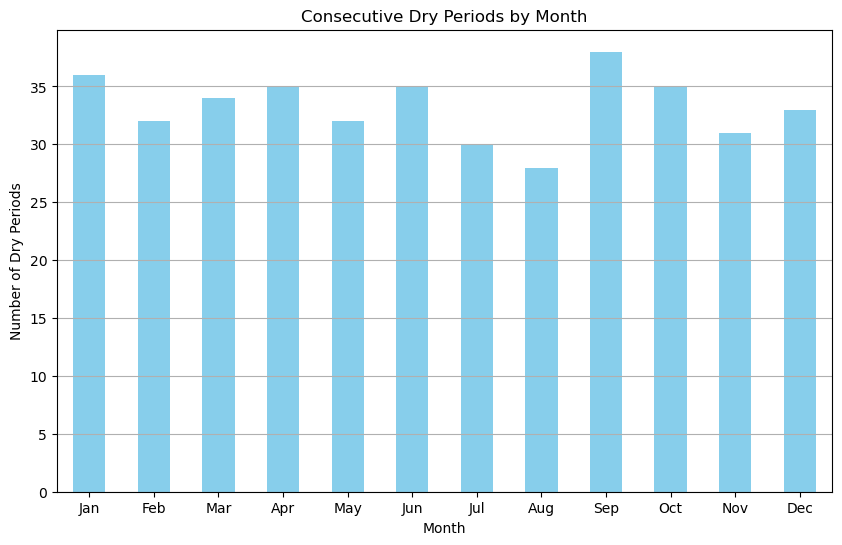

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the DataFrame from CSV
periods_df = pd.read_csv('Consecutive Dry Period.csv')

# Convert 'Start Date' and 'End Date' to datetime if not already
periods_df['Start Date'] = pd.to_datetime(periods_df['Start Date'])
periods_df['End Date'] = pd.to_datetime(periods_df['End Date'])

# Extract the month from 'Start Date' and 'End Date', then find the unique months involved in each period
periods_df['Months Involved'] = periods_df.apply(lambda row: list(set([pd.Timestamp(date).month for date in pd.date_range(row['Start Date'], row['End Date'], freq='M')])), axis=1)

# Flatten the list of months and count occurrences
all_months_involved = [month for sublist in periods_df['Months Involved'] for month in sublist]
month_counts = pd.Series(all_months_involved).value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 6))
month_counts.plot(kind='bar', color='skyblue')
plt.title('Consecutive Dry Periods by Month')
plt.xlabel('Month')
plt.ylabel('Number of Dry Periods')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
plt.grid(axis='y')

plt.show()


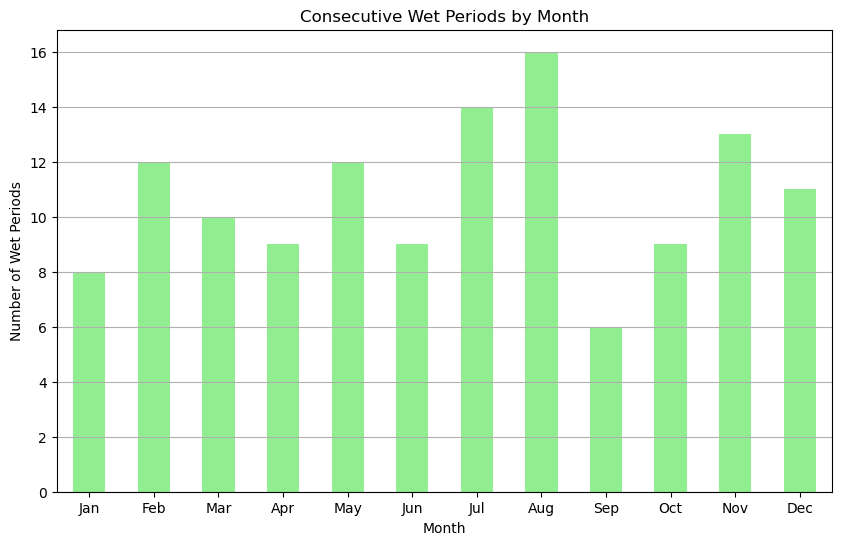

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' has already been loaded, preprocessed, and the 'Date' column has been converted to datetime
# Make sure to include this step again if the DataFrame has been reloaded or modified
df['Date'] = pd.to_datetime(df['Date'])

# Identify consecutive wet periods
consecutive_wet_periods = []
start_date, previous_date = None, None

for _, row in df.sort_values('Date').iterrows():
    if row['Rainfall..mm.'] >= 1:
        if start_date is None:
            start_date = row['Date']
        previous_date = row['Date']
    else:
        if start_date is not None:
            consecutive_wet_periods.append((start_date, previous_date))
            start_date = None

if start_date is not None and previous_date is not None:
    consecutive_wet_periods.append((start_date, previous_date))

# Analyze monthly occurrences
wet_periods_info = []

for start_date, end_date in consecutive_wet_periods:
    total_rainfall = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]['Rainfall..mm.'].sum()
    wet_periods_info.append({
        'Start Date': start_date,
        'End Date': end_date,
        'Total Rainfall (mm)': total_rainfall
    })

# Convert to DataFrame for easier analysis
wet_periods_df = pd.DataFrame(wet_periods_info)
wet_periods_df['Start Date'] = pd.to_datetime(wet_periods_df['Start Date'])
wet_periods_df['End Date'] = pd.to_datetime(wet_periods_df['End Date'])

# Find unique months involved in each period
wet_periods_df['Months Involved'] = wet_periods_df.apply(lambda row: list(set([pd.Timestamp(date).month for date in pd.date_range(row['Start Date'], row['End Date'], freq='M')])), axis=1)

# Flatten the list and count occurrences
all_months_involved_wet = [month for sublist in wet_periods_df['Months Involved'] for month in sublist]
month_counts_wet = pd.Series(all_months_involved_wet).value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 6))
month_counts_wet.plot(kind='bar', color='lightgreen')
plt.title('Consecutive Wet Periods by Month')
plt.xlabel('Month')
plt.ylabel('Number of Wet Periods')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
plt.grid(axis='y')

plt.show()


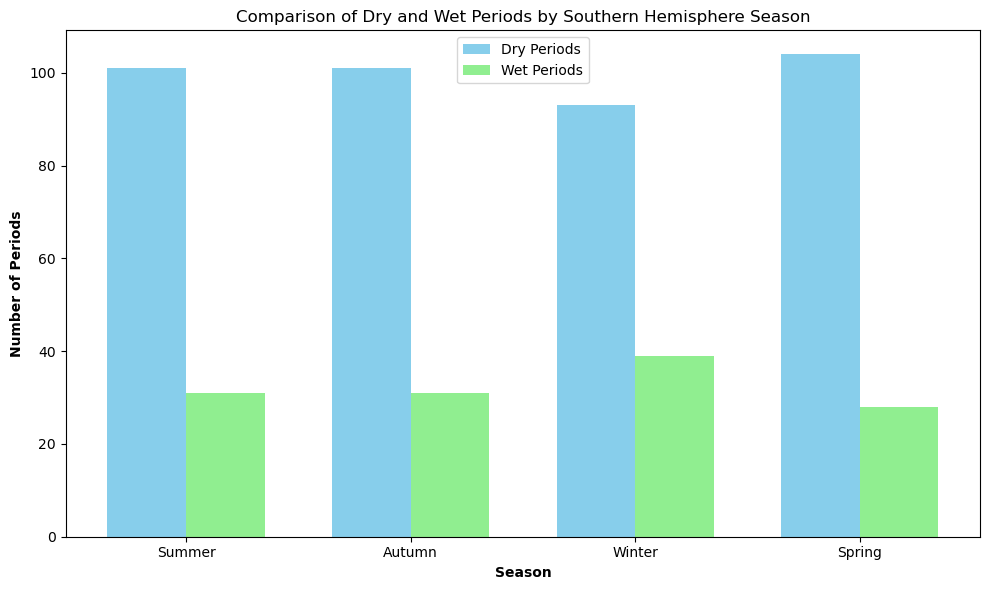

In [49]:
# Prepare data for plotting
seasons = ['Summer', 'Autumn', 'Winter', 'Spring']
dry_counts = [dry_season_counts.get(season, 0) for season in seasons]
wet_counts = [wet_season_counts.get(season, 0) for season in seasons]

# Set up the figure and axes for plotting
fig, ax = plt.subplots(figsize=(10, 6))

# Set position of bar on X axis
bar_width = 0.35
r1 = np.arange(len(seasons))
r2 = [x + bar_width for x in r1]

# Make the plot
ax.bar(r1, dry_counts, color='skyblue', width=bar_width, label='Dry Periods')
ax.bar(r2, wet_counts, color='lightgreen', width=bar_width, label='Wet Periods')

# Add xticks on the middle of the group bars
ax.set_xlabel('Season', fontweight='bold')
ax.set_ylabel('Number of Periods', fontweight='bold')
ax.set_title('Comparison of Dry and Wet Periods by Southern Hemisphere Season')
ax.set_xticks([r + bar_width/2 for r in range(len(seasons))])
ax.set_xticklabels(seasons)

ax.legend()

plt.tight_layout()
plt.show()


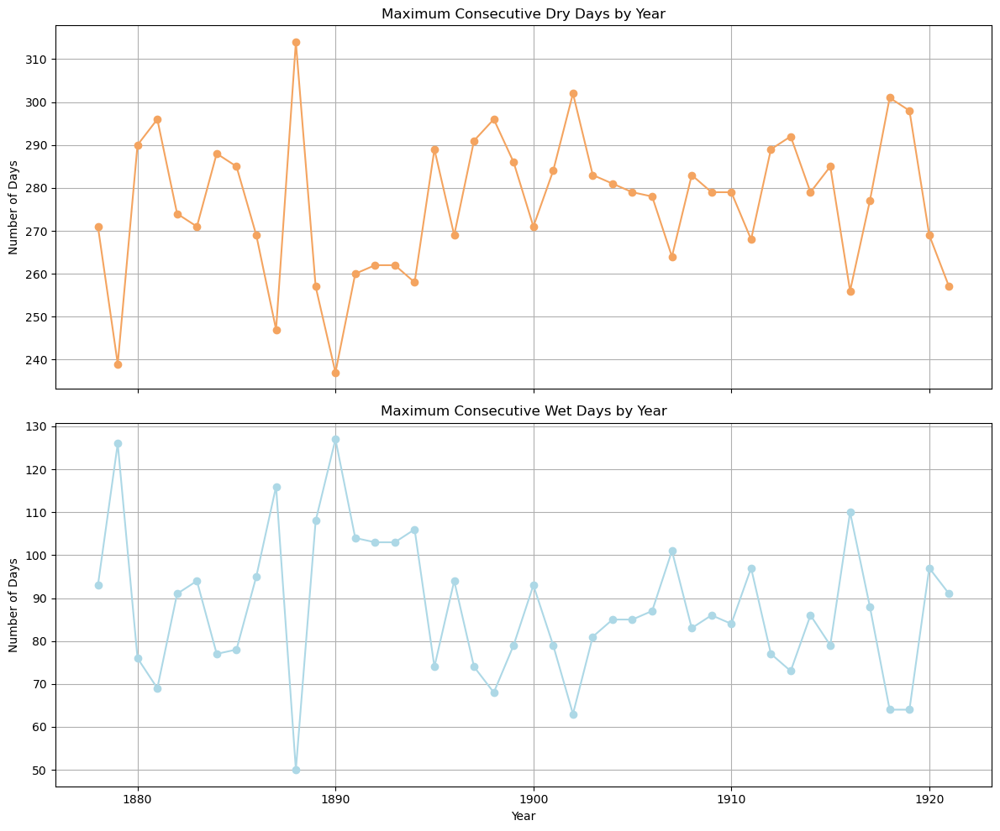

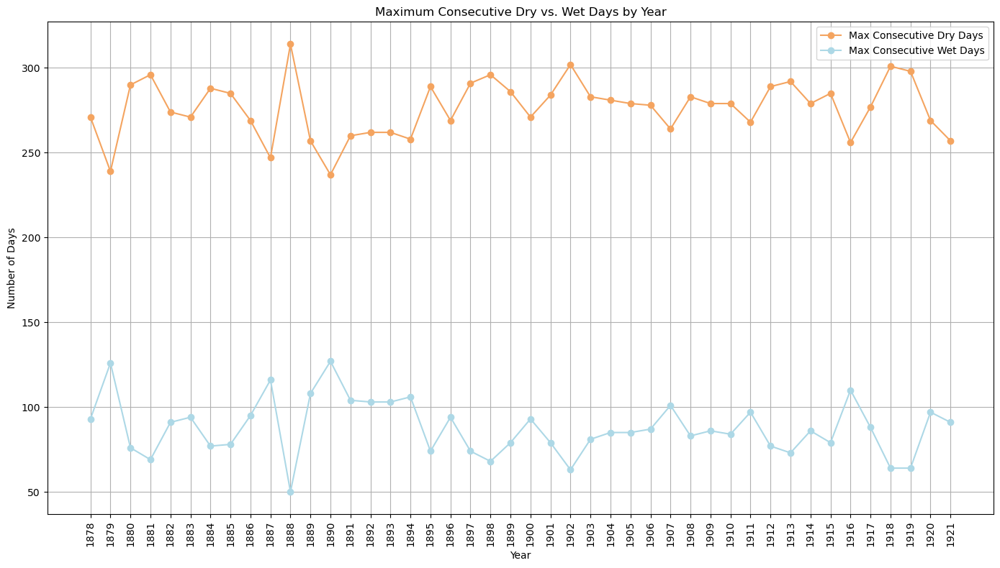

In [25]:
import matplotlib.pyplot as plt

# Convert Series to DataFrames for easier plotting
df_max_dry_days_yearly = max_dry_days_yearly.reset_index()
df_max_wet_days_yearly = max_wet_days_yearly.reset_index()

# Plotting
fig, axs = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Plot Maximum Consecutive Dry Days by Year
axs[0].plot(df_max_dry_days_yearly['Year'], df_max_dry_days_yearly['Length'], marker='o', linestyle='-', color='sandybrown')
axs[0].set_title('Maximum Consecutive Dry Days by Year')
axs[0].set_ylabel('Number of Days')
axs[0].grid(True)

# Plot Maximum Consecutive Wet Days by Year
axs[1].plot(df_max_wet_days_yearly['Year'], df_max_wet_days_yearly['Length'], marker='o', linestyle='-', color='lightblue')
axs[1].set_title('Maximum Consecutive Wet Days by Year')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Number of Days')
axs[1].grid(True)

plt.tight_layout()
plt.show()

# Assuming df_max_dry_days_yearly and df_max_wet_days_yearly are DataFrames containing your data

plt.figure(figsize=(14, 8))

# Plot Maximum Consecutive Dry Days by Year
plt.plot(df_max_dry_days_yearly['Year'], df_max_dry_days_yearly['Length'], 
         marker='o', linestyle='-', color='sandybrown', label='Max Consecutive Dry Days')

# Plot Maximum Consecutive Wet Days by Year
plt.plot(df_max_wet_days_yearly['Year'], df_max_wet_days_yearly['Length'], 
         marker='o', linestyle='-', color='lightblue', label='Max Consecutive Wet Days')

# Set x-ticks to show every year
years = df_max_dry_days_yearly['Year'].unique()  # Assuming both dataframes cover the same years, otherwise adjust accordingly
plt.xticks(years, rotation=90)  # Rotate for better readability

# Adding titles and labels
plt.title('Maximum Consecutive Dry vs. Wet Days by Year')
plt.xlabel('Year')
plt.ylabel('Number of Days')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


KeyError: 'Category'

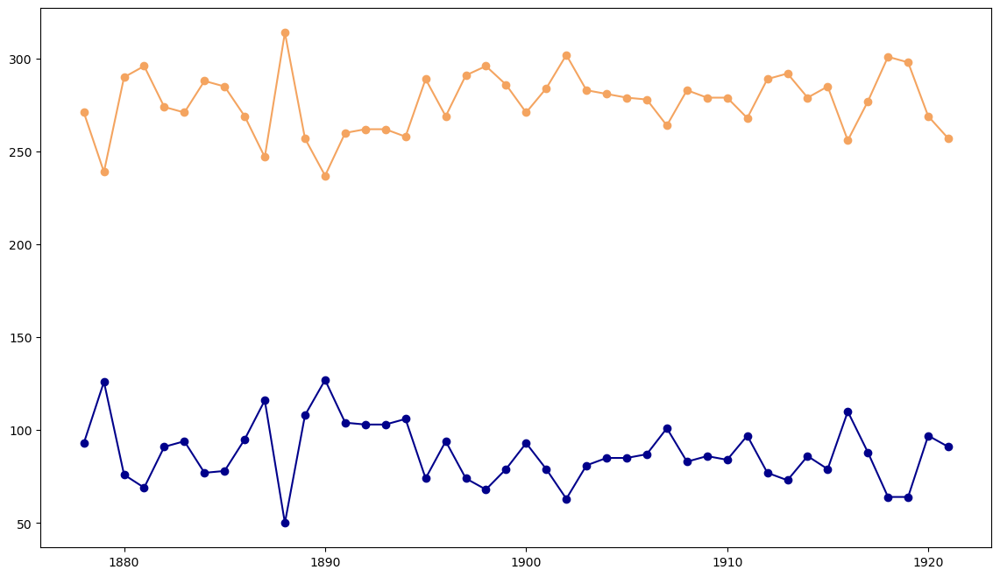

In [32]:
import matplotlib.pyplot as plt


fig, ax1 = plt.subplots(figsize=(14, 8))

# Plot Maximum Consecutive Dry Days by Year as line plot on primary y-axis (left)
ax1.plot(df_max_dry_days_yearly['Year'], df_max_dry_days_yearly['Length'], 
         marker='o', linestyle='-', color='sandybrown', label='Max Consecutive Dry Days')

# Plot Maximum Consecutive Wet Days by Year as line plot on primary y-axis (left)
ax1.plot(df_max_wet_days_yearly['Year'], df_max_wet_days_yearly['Length'], 
         marker='o', linestyle='-', color='Darkblue', label='Max Consecutive Wet Days')
# Assuming the 'Category' column is correctly included after the merge
combined_df = pd.concat([df_max_dry_days_yearly, df_max_wet_days_yearly]).drop_duplicates('Year')

# Adding vertical lines for years based on the category
for _, row in df_max_dry_days_yearly.iterrows():
    if row['Category'] == 'Below Normal':
        ax1.axvline(x=row['Year'], color='red', linestyle='--', alpha=1)
    elif row['Category'] == 'Above Normal':
        ax1.axvline(x=row['Year'], color='blue', linestyle='--', alpha=1)

# Setting x-axis to show every year
years = sorted(list(set(df_max_dry_days_yearly['Year'].unique()).union(set(df_max_wet_days_yearly['Year'].unique()))))
ax1.set_xticks(years)
ax1.tick_params(axis='x', rotation=90)

# Adding titles, labels, and grid for the primary y-axis (left)
ax1.set_title('Maximum Consecutive Dry/Wet Days & Extremely Wet Days per Year')
ax1.set_xlabel('Year')
ax1.set_ylabel('Max Consecutive Days')
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
ax1.legend(loc='upper left')

# Create a secondary y-axis (right) for the bubble plot representing extremely wet days
ax2 = ax1.twinx()

# The bubble size needs to be adjusted according to your specific dataset to fit well in the graph.
bubble_size_multiplier = 50  # Adjust this value as needed

for year, value in yearly_extreme_events.iteritems():
    bubble_size = value * bubble_size_multiplier
    ax2.scatter(year, value, s=bubble_size, color='darkgreen', alpha=0.6, edgecolors='black', zorder=5)
    ax2.text(year, value, str(value), color='black', fontsize=20, ha='center', va='bottom')

ax2.set_ylabel('Number of Extremely Wet Days')

plt.tight_layout()
plt.show()



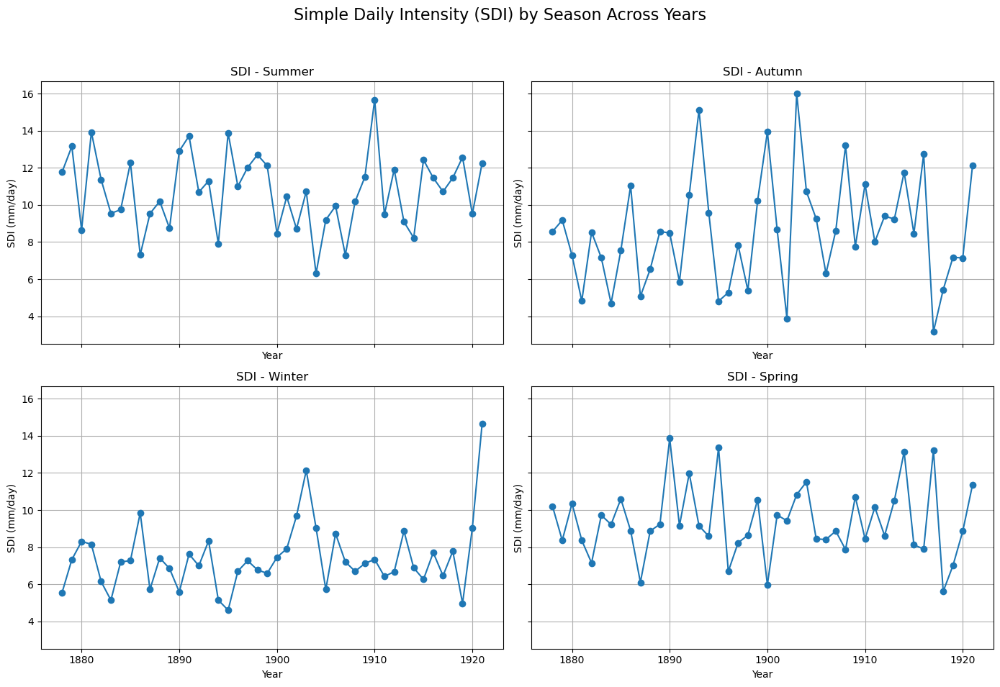

Average Simple Daily Intensity (SDI) for each season:
Season
Autumn     8.552341
Spring     9.364296
Summer    10.729547
Winter     7.391876


In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is loaded correctly from 'Rainfall values without -99.9 values.csv'
df = pd.read_csv('Rainfall values without -99.9 values.csv')

# Exclude specific years
df = df[(df['Year'] != 1877) & (df['Year'] != 1922)]

# Define wet days (daily precipitation ≥ 1 mm)
df['Wet Day'] = df['Rainfall..mm.'] >= 1

# Ensure 'Month' is correctly processed as numeric
df['Month'] = pd.to_numeric(df['Month'], errors='coerce')

# Correct the month to season mapping, assuming 'Month' is a numeric column
def month_to_season(month):
    if month in [12, 1, 2]:  # Summer
        return 'Summer'
    elif month in [3, 4, 5]:  # Autumn
        return 'Autumn'
    elif month in [6, 7, 8]:  # Winter
        return 'Winter'
    elif month in [9, 10, 11]:  # Spring
        return 'Spring'
    
df['Season'] = df['Month'].apply(month_to_season)

# Group by 'Year' and 'Season', and calculate SDI
annual_data = df.groupby(['Year', 'Season'], as_index=False).agg(
    Total_Precipitation=('Rainfall..mm.', 'sum'),
    Wet_Days=('Wet Day', 'sum')
)
annual_data['SDI'] = annual_data['Total_Precipitation'] / annual_data['Wet_Days']

# Plot SDI by season across years in a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
seasons = ['Summer', 'Autumn', 'Winter', 'Spring']
axs = axs.flatten()

for i, season in enumerate(seasons):
    season_data = annual_data[annual_data['Season'] == season]
    axs[i].plot(season_data['Year'], season_data['SDI'], marker='o', linestyle='-')
    axs[i].set_title(f'SDI - {season}')
    axs[i].grid(True)
    axs[i].set_xlabel('Year')
    axs[i].set_ylabel('SDI (mm/day)')

plt.suptitle('Simple Daily Intensity (SDI) by Season Across Years', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Calculate the average SDI for each season
average_sdi_by_season = annual_data.groupby('Season')['SDI'].mean()

# Print the average SDI for each season
print("Average Simple Daily Intensity (SDI) for each season:")
print(average_sdi_by_season.to_string())


C:\Users\manda\AppData\Local\Temp\ipykernel_12688\1164307172.py:27: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for year, rainfall in annual_total_rainfall.iteritems():


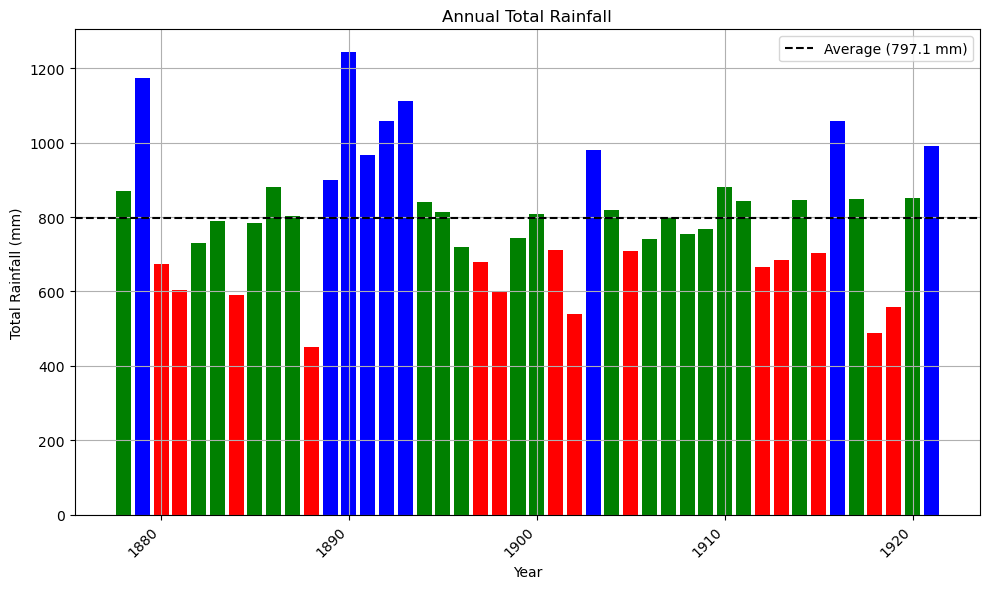

Years categorized by rainfall deviation have been saved to 'yearly_rainfall_categories.csv'.


C:\Users\manda\AppData\Local\Temp\ipykernel_12688\1164307172.py:50: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for year, rainfall in annual_total_rainfall.iteritems():
C:\Users\manda\AppData\Local\Temp\ipykernel_12688\1164307172.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  year_categories = year_categories.append({'Year': year.year, 'Category': category}, ignore_index=True)
C:\Users\manda\AppData\Local\Temp\ipykernel_12688\1164307172.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  year_categories = year_categories.append({'Year': year.year, 'Category': category}, ignore_index=True)
C:\Users\manda\AppData\Local\Temp\ipykernel_12688\1164307172.py:60: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the saved data
monthly_total_rainfall = pd.read_csv('monthly_total_rainfall.csv')

# Convert 'Year' column to datetime
monthly_total_rainfall['Year'] = pd.to_datetime(monthly_total_rainfall['Year'], format='%Y')

# Filter out years 1877 and 1922
monthly_total_rainfall = monthly_total_rainfall[~monthly_total_rainfall['Year'].dt.year.isin([1877, 1922])]

# Aggregate total rainfall values for each year
annual_total_rainfall = monthly_total_rainfall.groupby('Year')['Total Rainfall (mm)'].sum()

# Calculate average total annual rainfall and standard deviation
average_annual_rainfall = annual_total_rainfall.mean()
std_annual_rainfall = annual_total_rainfall.std()

# Plot the graph for annual total rainfall with average line
plt.figure(figsize=(10, 6))

# Plot average line
plt.axhline(average_annual_rainfall, color='black', linestyle='--', label=f'Average ({average_annual_rainfall:.1f} mm)')

# Plot annual total rainfall bars
for year, rainfall in annual_total_rainfall.iteritems():
    deviation = rainfall - average_annual_rainfall
    if deviation <= -0.5 * std_annual_rainfall:
        color = 'red'
    elif deviation >= 0.5 * std_annual_rainfall:
        color = 'blue'
    else:
        color = 'green'
    plt.bar(year.year, rainfall, color=color)

plt.title('Annual Total Rainfall')
plt.xlabel('Year')
plt.ylabel('Total Rainfall (mm)')
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis ticks for better readability
plt.legend()
plt.tight_layout()
plt.show()

#Initialize an empty DataFrame for year categorizations
year_categories = pd.DataFrame(columns=['Year', 'Category'])

# Populate the DataFrame with categorizations
for year, rainfall in annual_total_rainfall.iteritems():
    deviation = rainfall - average_annual_rainfall
    if deviation <= -0.5 * std_annual_rainfall:
        category = 'Below Normal'
    elif deviation >= 0.5 * std_annual_rainfall:
        category = 'Above Normal'
    else:
        category = 'Normal'
    
    # Append to the DataFrame
    year_categories = year_categories.append({'Year': year.year, 'Category': category}, ignore_index=True)

# Save the year categorizations to a CSV file
year_categories.to_csv('yearly_rainfall_categories.csv', index=False)

print("Years categorized by rainfall deviation have been saved to 'yearly_rainfall_categories.csv'.")

Wet years (above 90th percentile): 1879, 1890, 1892, 1893, 1916
Dry years (below 10th percentile): 1884, 1888, 1902, 1918, 1919
Annual total rainfall value for the 90th percentile (Wet years threshold): 1038.29 mm
Annual total rainfall value for the 10th percentile (Dry years threshold): 594.56 mm


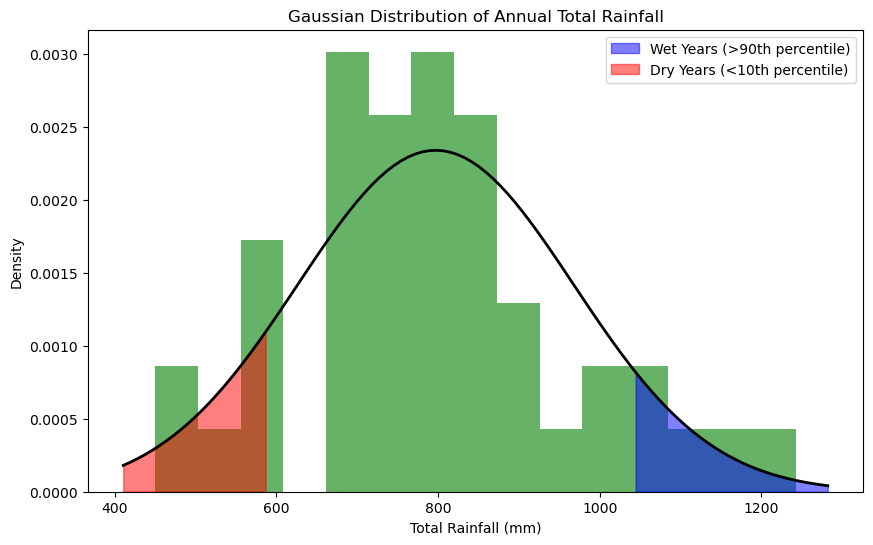

In [52]:
# Fit a Gaussian distribution
mu, std = norm.fit(annual_total_rainfall.values)

# Plot the histogram
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(annual_total_rainfall, bins=15, density=True, alpha=0.6, color='g')

# Plot the PDF
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)

# Highlight wet and dry years on the PDF, not the histogram
plt.fill_between(x, 0, p, where=(x > percentile_90th), color='blue', alpha=0.5, label='Wet Years (>90th percentile)')
plt.fill_between(x, 0, p, where=(x < percentile_10th), color='red', alpha=0.5, label='Dry Years (<10th percentile)')

plt.title('Gaussian Distribution of Annual Total Rainfall')
plt.xlabel('Total Rainfall (mm)')
plt.ylabel('Density')
plt.legend()

# Identifying and printing wet and dry years based on the percentiles
wet_years = annual_total_rainfall[annual_total_rainfall > percentile_90th].index
dry_years = annual_total_rainfall[annual_total_rainfall < percentile_10th].index

print(f"Wet years (above 90th percentile): {', '.join(wet_years)}")
print(f"Dry years (below 10th percentile): {', '.join(dry_years)}")

plt.show

print(f"Annual total rainfall value for the 90th percentile (Wet years threshold): {percentile_90th:.2f} mm")
print(f"Annual total rainfall value for the 10th percentile (Dry years threshold): {percentile_10th:.2f} mm")


No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local ma

/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1867/614505260.py:243: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1867/614505260.py:231: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local ma

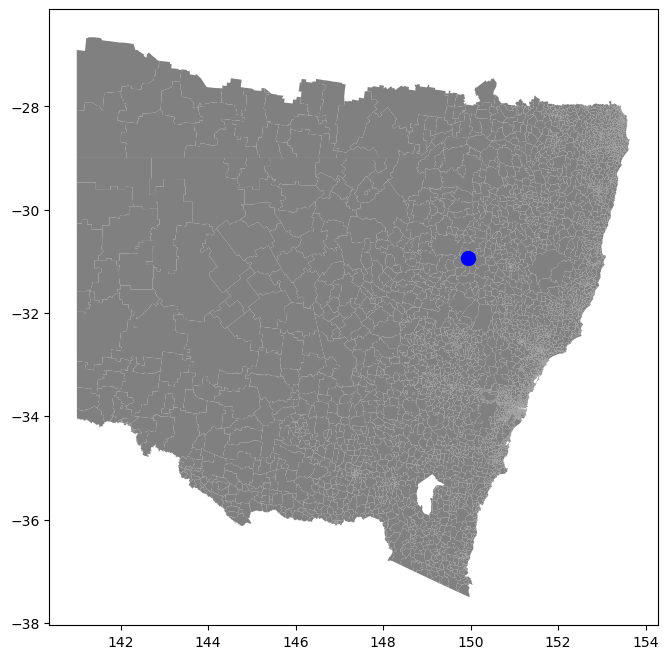

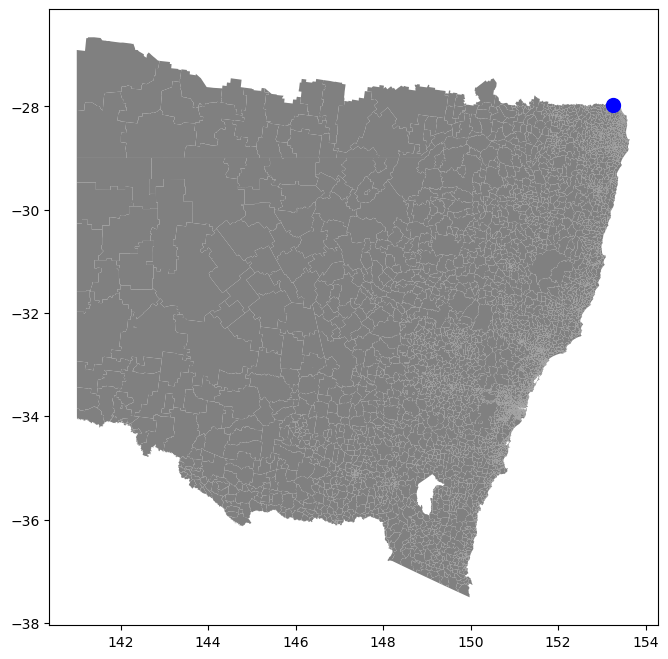

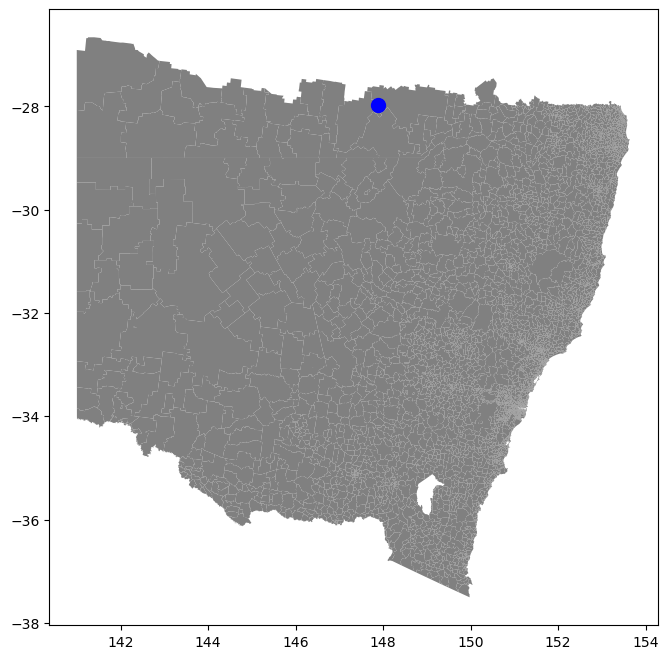

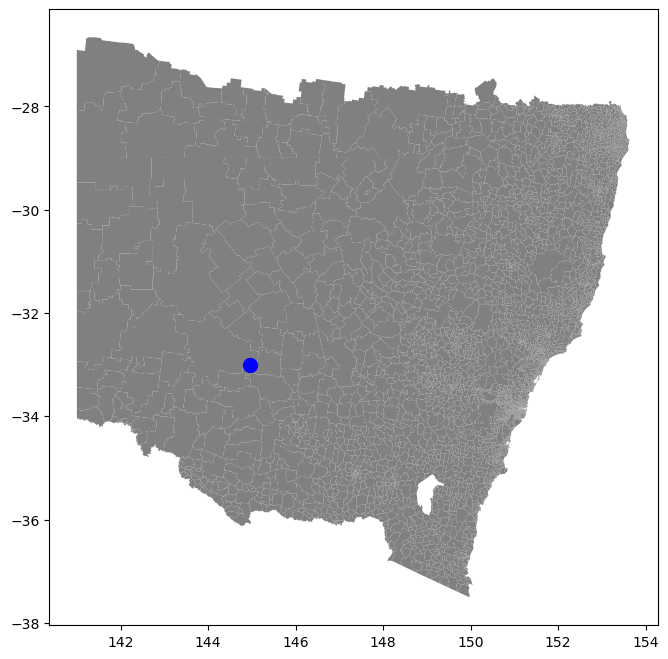

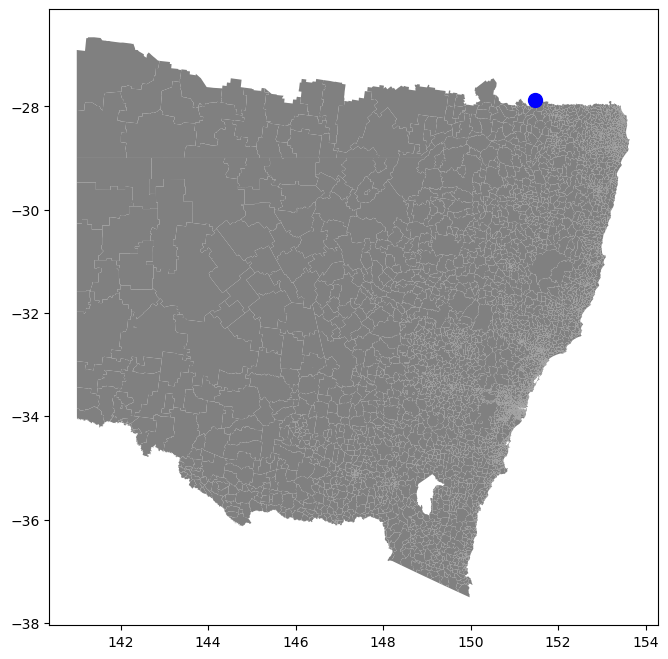

...

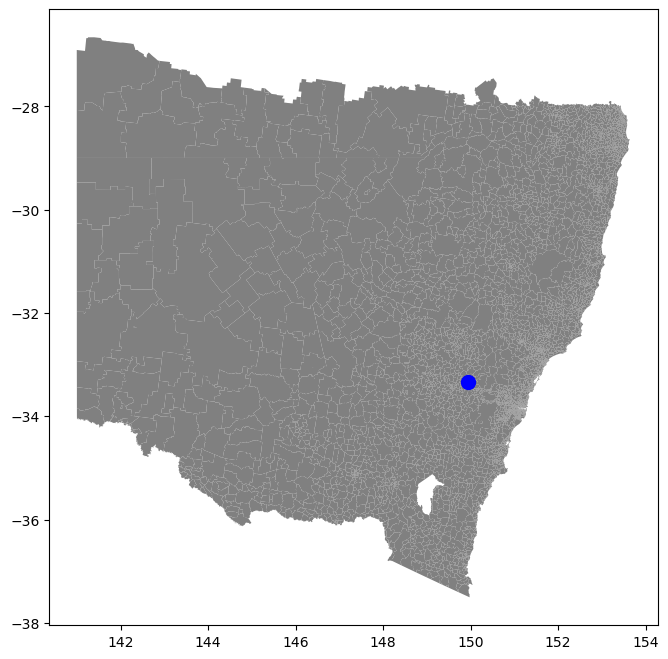

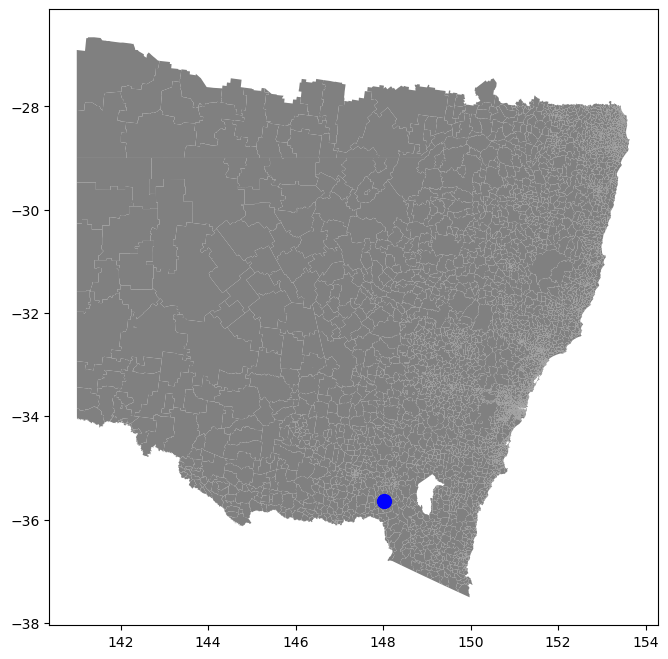

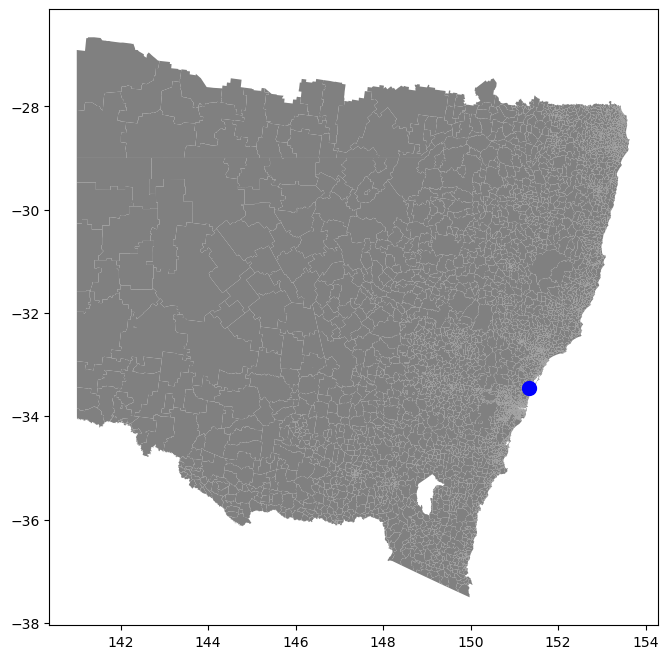

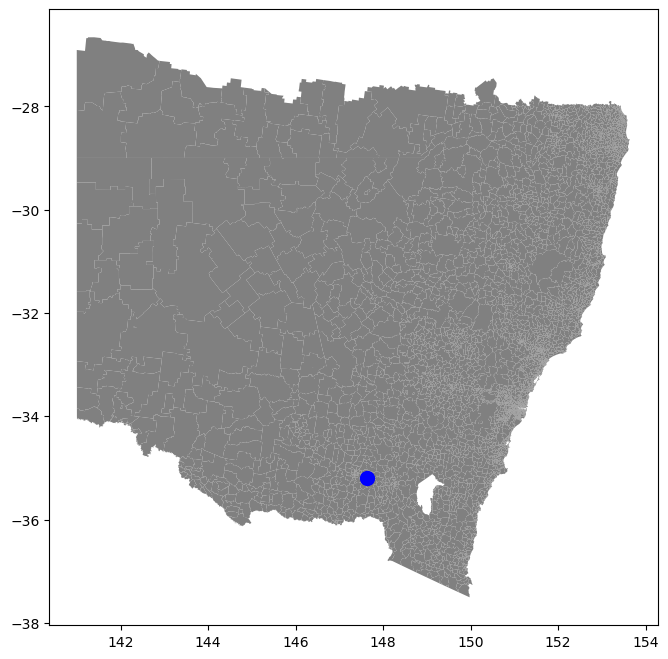

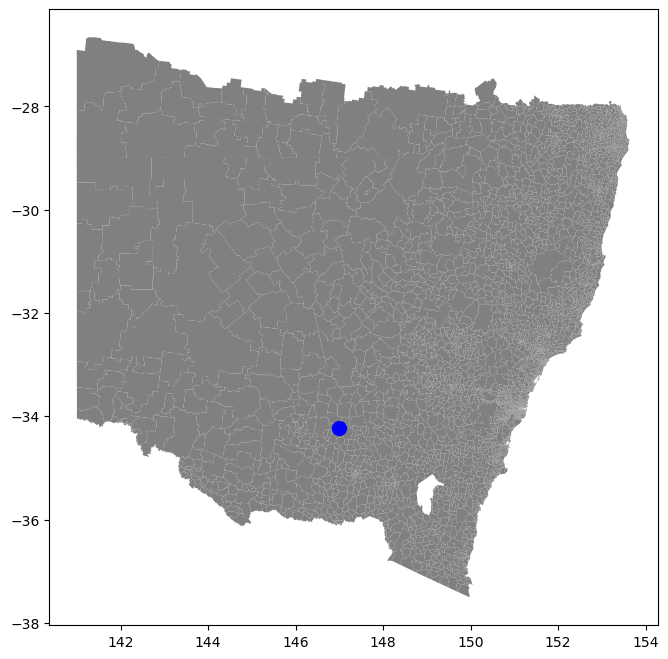

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from scipy.ndimage import gaussian_filter,maximum_filter
from scipy.sparse.csgraph import minimum_spanning_tree
import os

# Define paths
excel_file_path = '/Users/coolkarni/Desktop/OneDrive - The University of Melbourne/R1_99_New Events.xlsx'
csv_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/'
output_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_IDW_2Plots/'

# Load event names from the Excel file, skipping NaN values
event_df = pd.read_excel(excel_file_path, sheet_name='Sheet5')
event_names = event_df['Event'].dropna().unique()

# Initialize a list to store names of files that encountered errors
error_files = []

# Set distance threshold (e.g., in degrees, assuming coordinates are in lat/lon)
distance_threshold = 2  # Adjust as needed

# Haversine function to calculate distance between two lat/long coordinates
def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of earth in kilometers
    return c * r

# Function to find the mean rainfall value of the 5 nearest stations
def find_nearest_stations_mean_rainfall(df, lon, lat, column):
    df['distance'] = df.apply(lambda row: haversine(lon, lat, row['Longitude'], row['Latitude']), axis=1)
    nearest_stations = df.nsmallest(5, 'distance')
    mean_rainfall = nearest_stations[column].mean()
    return mean_rainfall

# Function to perform IDW interpolation
def perform_idw(latitude, longitude, rainfall):
    try:
        # Create a grid for interpolation
        xi, yi = np.meshgrid(np.linspace(min(longitude), max(longitude), 100),
                             np.linspace(min(latitude), max(latitude), 100))
        zi = np.zeros_like(xi)

        for i in range(len(xi)):
            for j in range(len(yi)):
                distances = np.sqrt((longitude.values - xi[i, j])**2 + (latitude.values - yi[i, j])**2)
                weights = 1 / (distances + 1e-6)  # Avoid division by zero
                zi[i, j] = np.sum(weights * rainfall.values) / np.sum(weights)

        zi_smoothed = gaussian_filter(zi, sigma=2)
        return zi_smoothed, None
    except Exception as e:
        return None, str(e)

# Function to connect points within each cluster using Minimum Spanning Tree
def connect_points_within_cluster(points, ax, color):
    if len(points) < 2:
        return
    # Compute the distance matrix
    distance_matrix = cdist(points, points)
    # Compute the MST using the distance matrix
    mst = minimum_spanning_tree(distance_matrix).toarray()
    # Plot the MST
    for i in range(len(points)):
        for j in range(len(points)):
            if mst[i, j] > 0:
                ax.plot([points[i][0], points[j][0]], [points[i][1], points[j][1]], linestyle='-', color=color, alpha=0.5)

# Process each event
for event_name in event_names:
    # Construct the path to the corresponding CSV file
    csv_file = os.path.join(csv_directory, f"{event_name}.csv")
    
    try:
        # Load the CSV file
        df = pd.read_csv(csv_file)

        # Filter out NaN values in latitude and longitude
        x_cleaned = df[['Latitude', 'Longitude'] + [col for col in df.columns if col.startswith('Rainfall')]].dropna()

        # Read the shapefile (assuming you have this in your directory)
        shapefile_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_shapefile.shp'
        gdf = gpd.read_file(shapefile_path)

        # Create a grid of points within the bounds of the shapefile
        minx, miny, maxx, maxy = gdf.total_bounds
        xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))
        positions = np.vstack([xi.ravel(), yi.ravel()])

        # Initialize lists to store coordinates of maxima and their annotations
        global_maxima_coords = []
        filtered_maxima_coords = []
        annotations = []

        # Iterate through each rainfall column and generate plots
        rainfall_columns = [col for col in x_cleaned.columns if col.startswith('Rainfall')]

        for idx, col in enumerate(rainfall_columns, start=1):
            rainfall = x_cleaned[col]

            # Perform IDW interpolation
            zi, _ = perform_idw(x_cleaned['Latitude'], x_cleaned['Longitude'], rainfall)

            # Mask the grid to include only points inside the shapefile geometry
            points = np.vstack((xi.flatten(), yi.flatten())).T
            mask = np.array([gdf.contains(Point(point)).any() for point in points])
            mask = mask.reshape(xi.shape)
            zi = np.where(mask, zi, np.nan)

            # Find global maximum
            global_max_value = np.nanmax(zi)
            global_max_index = np.unravel_index(np.nanargmax(zi), zi.shape)
            global_max_x = xi[global_max_index]
            global_max_y = yi[global_max_index]

            # Find local maxima (peaks)
            local_max = maximum_filter(zi, size=10) == zi
            peaks = np.where(local_max, zi, np.nan)

            # Calculate 50th percentile value of global maximum
            percentile_90 = 0.9 * global_max_value

            # Remove peaks not within 90th percentile of global maximum
            peaks_filtered = np.where(peaks >= percentile_90, peaks, np.nan)

            # Calculate distances from global maximum to each local maximum
            local_max_coords = np.array(list(zip(xi[np.isfinite(peaks_filtered)], yi[np.isfinite(peaks_filtered)])))
            global_max_coords = np.array([[global_max_x, global_max_y]])
            
            # Check if there are any local maxima
            if local_max_coords.shape[0] > 0:
                # Calculate distances from global maximum to each local maximum
                distances = cdist(global_max_coords, local_max_coords)[0]

                # Apply distance threshold to filter out local maxima too close to the global maximum
                valid_indices = distances > distance_threshold
                filtered_peaks_coords = local_max_coords[valid_indices]
                filtered_peaks_values = peaks_filtered[np.isfinite(peaks_filtered)][valid_indices]

                # Proceed with processing filtered peaks...
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))
            else:
                print("No local maxima found, skipping filtering.")

            # Find mean rainfall value at the global maximum
            global_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, global_max_x, global_max_y, col)

            # Check if global maxima exceeds 25.00 mm threshold
            if global_max_rainfall_mean >= 25.00:
                global_maxima_coords.append((global_max_x, global_max_y))
                annotations.append((global_max_x, global_max_y, f'{idx}'))

                # Store filtered local maxima (peaks) that also exceed 25.00 mm threshold
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))
            else:
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))

        # Combine global and filtered local maxima coordinates
        all_maxima_coords = np.array(global_maxima_coords + filtered_maxima_coords)

        # Divide the map into longitude sections and count points in each section
        long_sections = [140, 144, 148, 154]  # Define longitude section boundaries
        section_counts = [0] * (len(long_sections) - 1)
        
        # Set to store unique points that are counted
        counted_points = set()

        for lon, lat in all_maxima_coords:
            for i in range(len(long_sections) - 1):
                if long_sections[i] - 0.05 < lon < long_sections[i + 1] + 0.05:
                    counted_points.add((lon, lat))
                    section_counts[i] += 1

        # Check if at least two sections satisfy the criteria
        point_threshold = 1
        satisfying_sections = sum(count > point_threshold for count in section_counts)
        perform_clustering = satisfying_sections >= 2

        if perform_clustering:
            # Perform K-means clustering with 2 clusters as a default
            kmeans = KMeans(n_clusters=2, random_state=0)
            cluster_labels = kmeans.fit_predict(all_maxima_coords)

            # Initialize dictionaries to store points for each cluster
            clusters = {label: [] for label in set(cluster_labels)}

            # Sort points into their respective clusters
            for label, point in zip(cluster_labels, all_maxima_coords):
                clusters[label].append(point)

            # Plotting code
            fig, ax = plt.subplots(figsize=(10, 8))
            gdf.plot(ax=ax, color='gray', edgecolor='none')

            # Connect points within the cluster using MST
            for label in clusters:
                cluster_points = clusters[label]

                # Choose a color based on the cluster label
                color = 'red' if label == 0 else 'blue'

                # Plot points
                for x, y in cluster_points:
                    ax.plot(x, y, marker='o', color=color, markersize=10)

                # Connect points within the cluster using MST
                connect_points_within_cluster(cluster_points, ax, color)

        else:
            # If no meaningful clusters are found, plot the maxima without clustering
            fig, ax = plt.subplots(figsize=(10, 8))
            gdf.plot(ax=ax, color='gray', edgecolor='none')

            # Plot points for maxima
            for i, (x, y) in enumerate(all_maxima_coords):
                ax.plot(x, y, marker='o', color='blue', markersize=10)

            # Connect points within the maxima using MST
            connect_points_within_cluster(all_maxima_coords, ax, 'blue')

        # If there's only one maxima point, just plot it
        if len(all_maxima_coords) == 1:
            fig, ax = plt.subplots(figsize=(10, 8))
            gdf.plot(ax=ax, color='gray', edgecolor='none')
            for x, y in all_maxima_coords:
                ax.plot(x, y, marker='o', color='blue', markersize=10)

        # Annotate points with numbers
        for x, y, label in annotations:
            ax.text(x, y, label, fontsize=10, ha='center', va='bottom', color='black', weight='bold')

        # Set labels and title
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title(f'{event_name}')

        # Save the output plot
        plt.savefig(os.path.join(output_directory, f"{event_name}_output.png"))
        plt.close()

    except Exception as e:
        # Append the event name to the error files list
        error_files.append(event_name)
        print(f"Error processing {event_name}: {e}")

# If there are any error files, save them to the new sheet in the existing Excel file
if error_files:
    # Load the existing data from the specified sheet
    try:
        existing_df = pd.read_excel(excel_file_path, sheet_name='IDW', engine='openpyxl')
    except ValueError:
        # If the sheet doesn't exist, create an empty DataFrame
        existing_df = pd.DataFrame()

    # Create a DataFrame for the new error files
    new_errors_df = pd.DataFrame({'Error Files': error_files})

    # Concatenate the existing data with the new error data
    combined_df = pd.concat([existing_df, new_errors_df], ignore_index=True)

    # Save the combined DataFrame back to the same sheet
    with pd.ExcelWriter(excel_file_path, mode='a', engine='openpyxl') as writer:
        combined_df.to_excel(writer, sheet_name='IDW', index=False)

print("Processing complete. Check the output directory for results and the Excel file for any errors.")


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1867/901270520.py:7: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import maximum_filter


No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 564 - 1899-01-09 to 1899-01-15: array must not contain infs or NaNs
Error processing Event 565 - 1884-04-22 to 1884-04-28: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 567 - 1883-03-17 to 1883-03-23: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 597 - 1879-01-30 to 1879-02-05: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 604 - 1873-06-17 to 1873-06-23: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 605 - 1878-03-24 to 1878-03-30: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 606 - 1880-12-06 to 1880-12-12: array must not contain infs or NaNs
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 612 - 1869-04-07 to 1869-04-13: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 613 - 1869-05-16 to 1869-05-22: array must not contain infs or NaNs
No local maxima found, skipping filtering.
Error processing Event 614 - 1870-01-13 to 1870-01-19: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 615 - 1870-08-10 to 1870-08-16: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 616 - 1870-08-19 to 1870-08-25: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 617 - 1873-12-09 to 1873-12-15: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 621 - 1882-01-13 to 1882-01-19: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 622 - 1882-12-09 to 1882-12-15: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 649 - 1876-04-05 to 1876-04-11: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 659 - 1876-12-27 to 1877-01-02: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 661 - 1880-01-06 to 1880-01-12: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 672 - 1881-02-11 to 1881-02-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 675 - 1858-05-24 to 1858-05-30: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 676 - 1860-02-07 to 1860-02-13: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 677 - 1861-02-13 to 1861-02-19: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 678 - 1872-10-01 to 1872-10-07: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1867/901270520.py:232: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 692 - 1872-12-18 to 1872-12-24: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 693 - 1874-10-24 to 1874-10-30: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 694 - 1875-03-26 to 1875-04-01: array must not contain infs or NaNs


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1867/901270520.py:221: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1867/901270520.py:221: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Error processing Event 701 - 1870-10-17 to 1870-10-23: array must not contain infs or NaNs
Error processing Event 702 - 1870-11-10 to 1870-11-16: array must not contain infs or NaNs
No local maxima found, skipping filtering.
Error processing Event 703 - 1871-01-11 to 1871-01-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 705 - 1874-05-17 to 1874-05-23: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 706 - 1877-01-09 to 1877-01-15: array must not contain infs or NaNs
No local maxima found, skipping filtering.
Error processing Event 716 - 1888-03-11 to 1888-03-17: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Error processing Event 719 - 1886-08-09 to 1886-08-15: aweights cannot be negative
Error processing Event 720 - 1886-11-04 to 1886-11-10: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaus

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 727 - 1873-12-30 to 1874-01-05: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 728 - 1878-06-11 to 1878-06-17: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


ValueError: Sheet 'IDW' already exists and if_sheet_exists is set to 'error'.

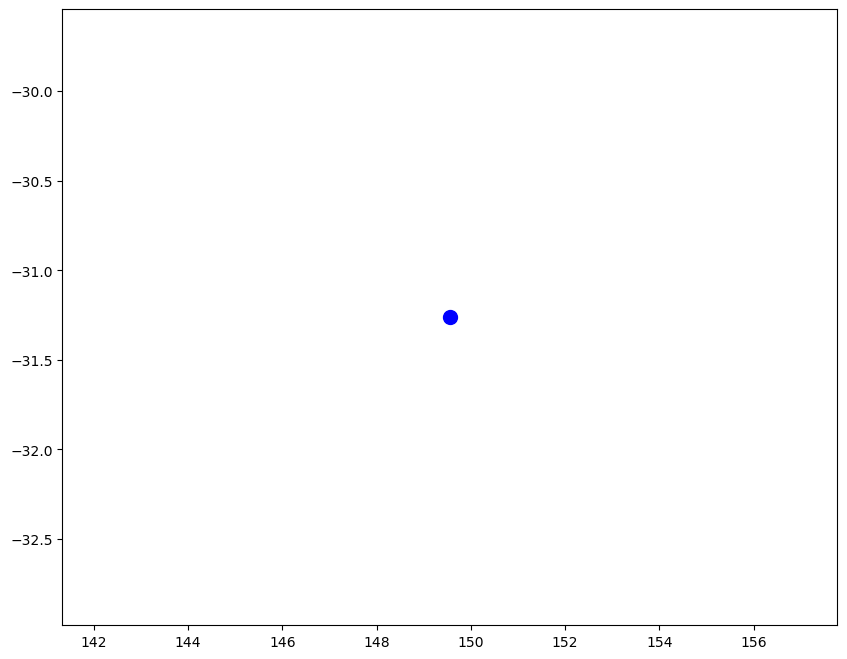

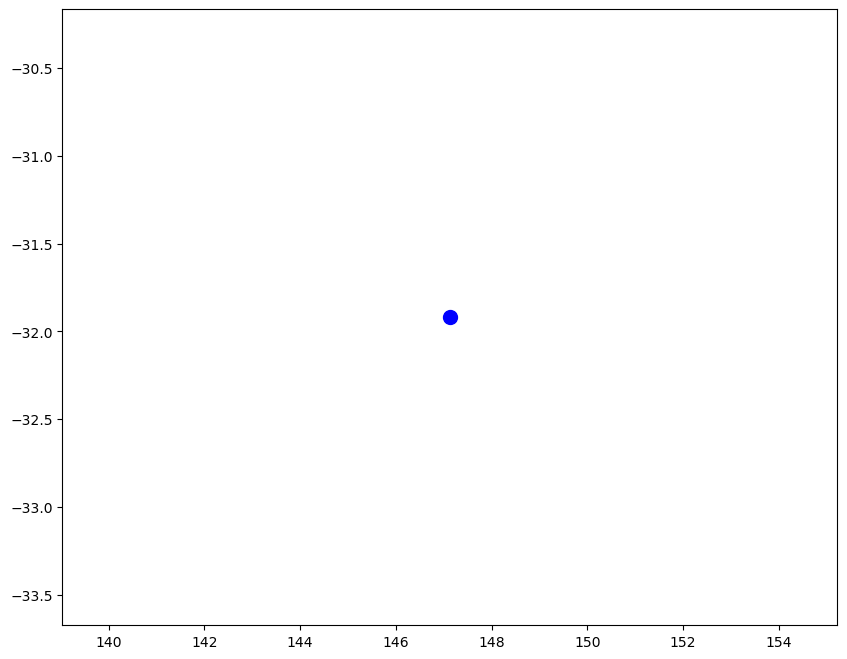

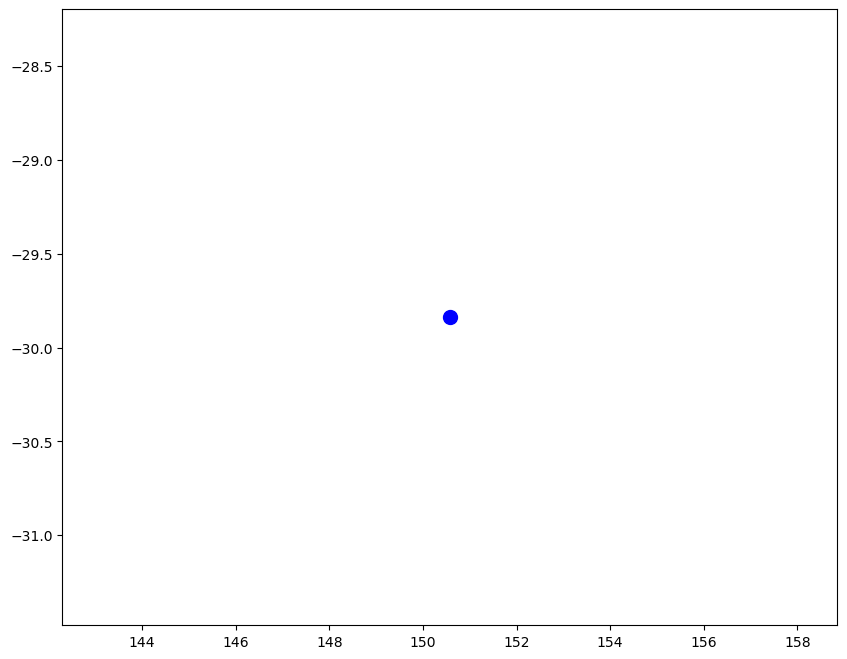

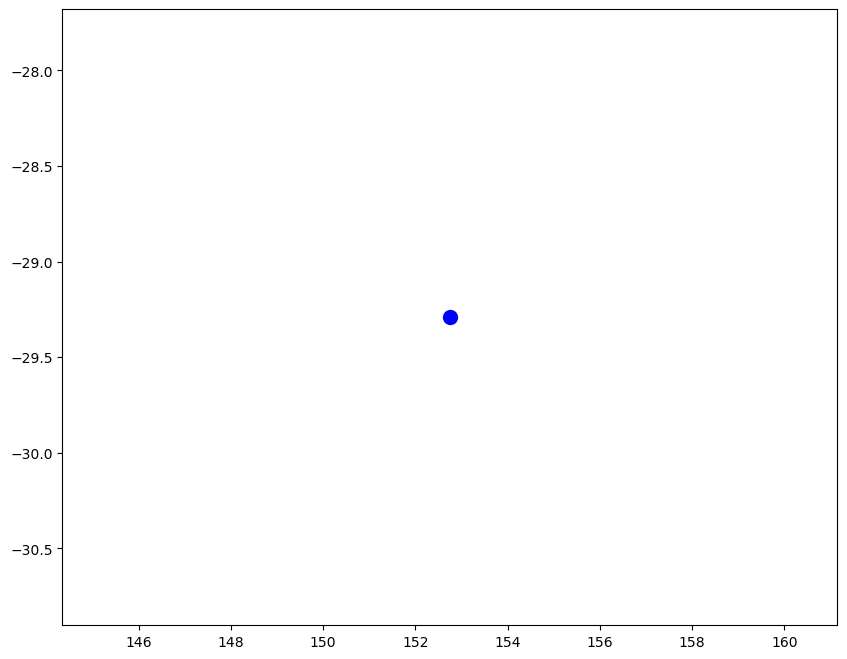

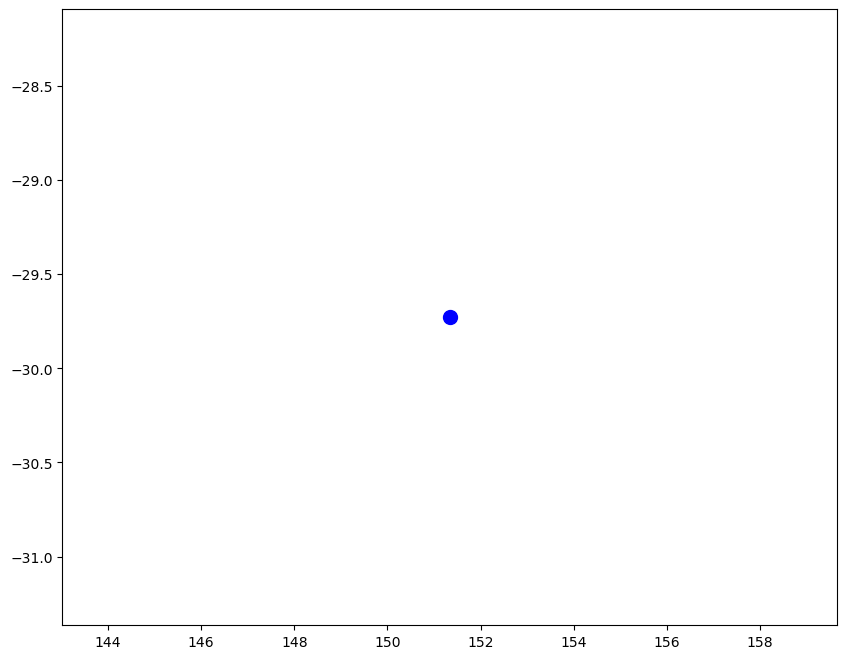

...

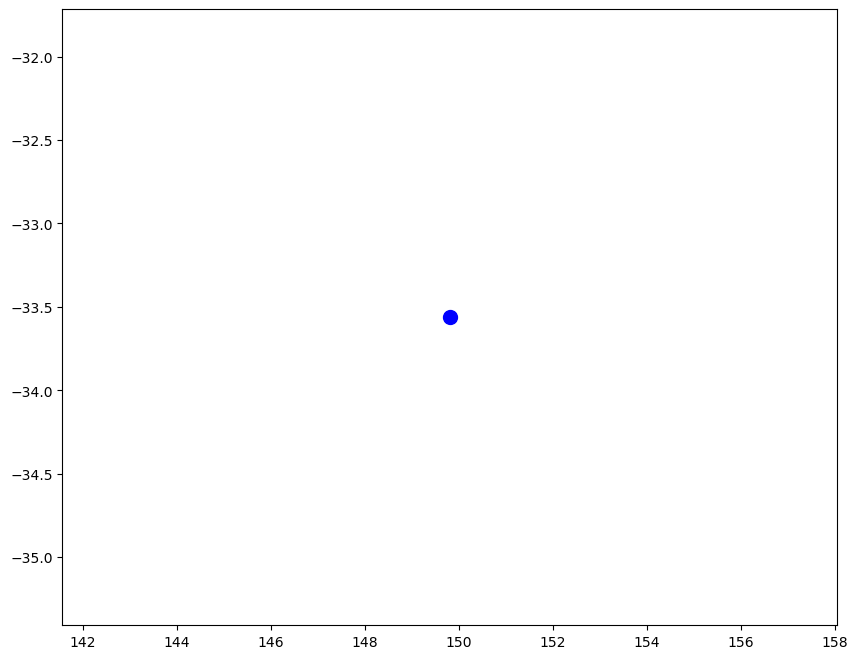

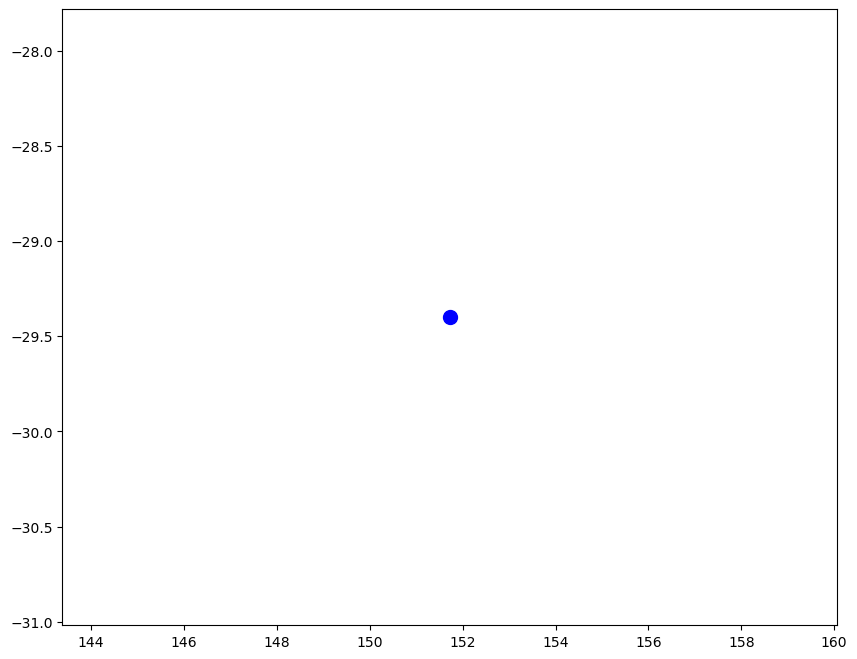

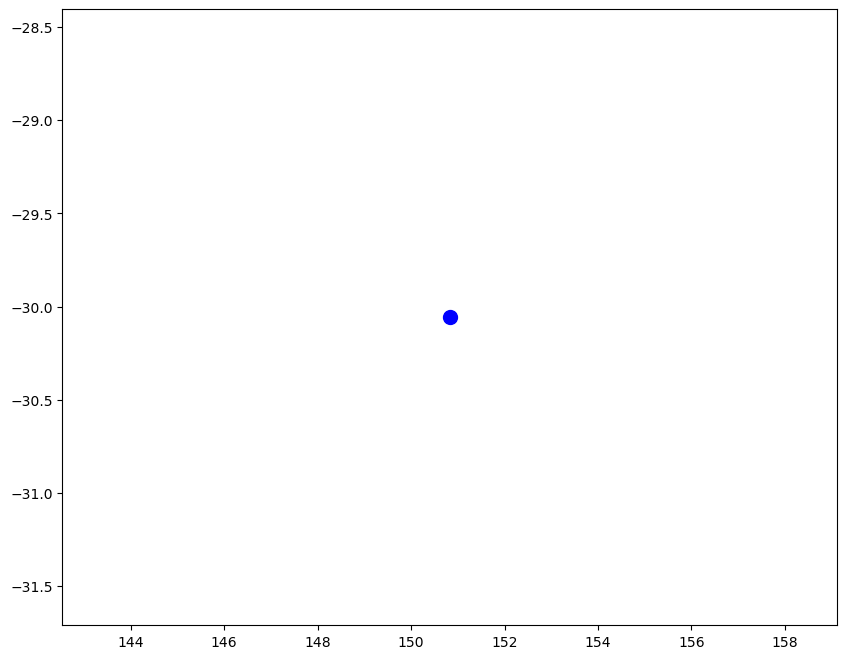

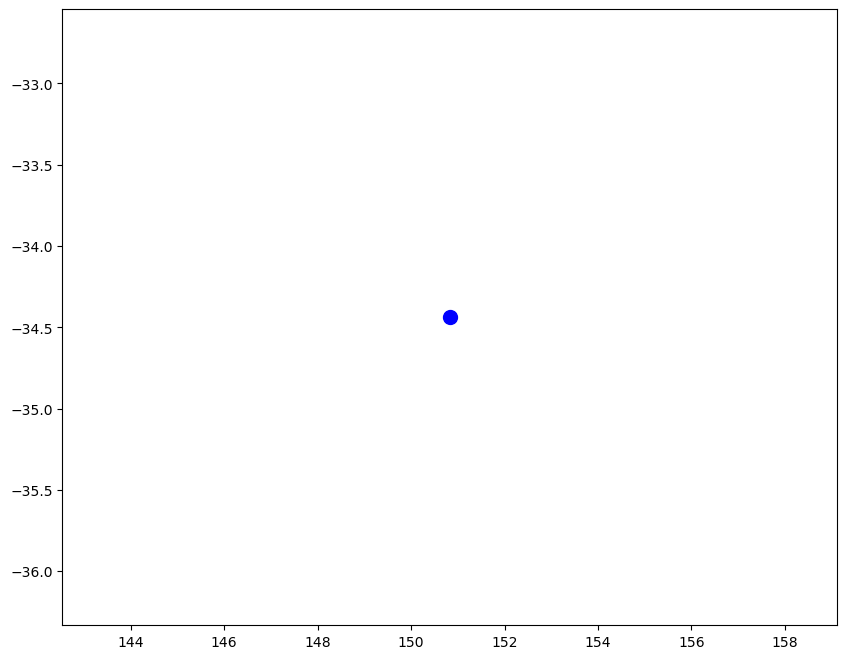

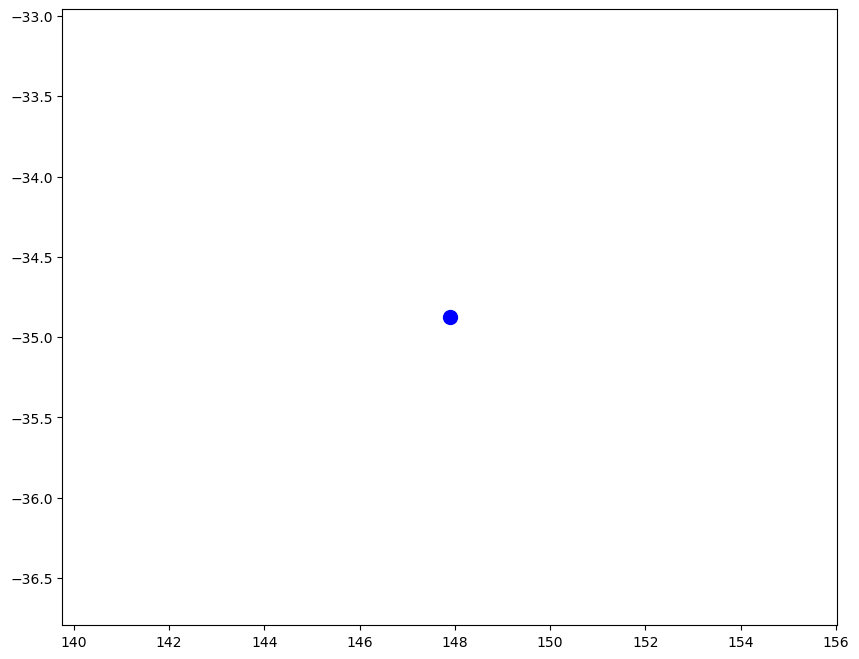

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.stats import gaussian_kde
from scipy.ndimage.filters import maximum_filter
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from scipy.sparse.csgraph import minimum_spanning_tree
import os

# Define paths
excel_file_path = '/Users/coolkarni/Desktop/OneDrive - The University of Melbourne/R1_99_New Events.xlsx'
csv_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/'
output_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_KDE_3Plots/'

# Load event names from the Excel file, skipping NaN values
event_df = pd.read_excel(excel_file_path,sheet_name='Sheet5')
event_names = event_df['Event'].dropna().unique()

# Initialize a list to store names of files that encountered errors
error_files = []

# Set distance threshold (e.g., in degrees, assuming coordinates are in lat/lon)
distance_threshold = 2  # Adjust as needed

# Haversine function to calculate distance between two lat/long coordinates
def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of earth in kilometers
    return c * r

# Function to find the mean rainfall value of the 5 nearest stations
def find_nearest_stations_mean_rainfall(df, lon, lat, column):
    df['distance'] = df.apply(lambda row: haversine(lon, lat, row['Longitude'], row['Latitude']), axis=1)
    nearest_stations = df.nsmallest(5, 'distance')
    mean_rainfall = nearest_stations[column].mean()
    return mean_rainfall

# Process each event
for event_name in event_names:
    # Construct the path to the corresponding CSV file
    csv_file = os.path.join(csv_directory, f"{event_name}.csv")
    
    try:
        # Load the CSV file
        df = pd.read_csv(csv_file)

        # Filter out NaN values in latitude and longitude
        x_cleaned = df[['Latitude', 'Longitude'] + [col for col in df.columns if col.startswith('Rainfall')]].dropna()

        # Read the shapefile (assuming you have this in your directory)
        shapefile_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_shapefile.shp'
        gdf = gpd.read_file(shapefile_path)

        # Create a grid of points within the bounds of the shapefile
        minx, miny, maxx, maxy = gdf.total_bounds
        xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))
        positions = np.vstack([xi.ravel(), yi.ravel()])

        # Initialize lists to store coordinates of maxima and their annotations
        global_maxima_coords = []
        filtered_maxima_coords = []
        annotations = []

        # Iterate through each rainfall column and generate plots
        rainfall_columns = [col for col in x_cleaned.columns if col.startswith('Rainfall')]

        for idx, col in enumerate(rainfall_columns, start=1):
            rainfall = x_cleaned[col]

            # Perform Gaussian KDE on the rainfall data
            values = np.vstack([x_cleaned['Longitude'], x_cleaned['Latitude']])
            kde = gaussian_kde(values, weights=rainfall, bw_method='scott')
            zi = kde(positions).reshape(xi.shape)

            # Mask the grid to include only points inside the shapefile geometry
            points = np.vstack((xi.flatten(), yi.flatten())).T
            mask = np.array([gdf.contains(Point(point)).any() for point in points])
            mask = mask.reshape(xi.shape)
            zi = np.where(mask, zi, np.nan)

            # Find global maximum
            global_max_value = np.nanmax(zi)
            global_max_index = np.unravel_index(np.nanargmax(zi), zi.shape)
            global_max_x = xi[global_max_index]
            global_max_y = yi[global_max_index]

            # Find local maxima (peaks)
            local_max = maximum_filter(zi, size=10) == zi
            peaks = np.where(local_max, zi, np.nan)

            # Calculate 50th percentile value of global maximum
            percentile_90 = 0.5 * global_max_value

            # Remove peaks not within 90th percentile of global maximum
            peaks_filtered = np.where(peaks >= percentile_90, peaks, np.nan)

            # Calculate distances from global maximum to each local maximum
            local_max_coords = np.array(list(zip(xi[np.isfinite(peaks_filtered)], yi[np.isfinite(peaks_filtered)])))
            global_max_coords = np.array([[global_max_x, global_max_y]])
            
            # Check if there are any local maxima
            if local_max_coords.shape[0] > 0:
               # Calculate distances from global maximum to each local maximum
               distances = cdist(global_max_coords, local_max_coords)[0]

               # Apply distance threshold to filter out local maxima too close to the global maximum
               valid_indices = distances > distance_threshold
               filtered_peaks_coords = local_max_coords[valid_indices]
               filtered_peaks_values = peaks_filtered[np.isfinite(peaks_filtered)][valid_indices]

               # Proceed with processing filtered peaks...
               for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                         filtered_maxima_coords.append((x, y))
                         annotations.append((x, y, f'{idx}'))
            else:
              # No local maxima found, skip this chunk
              print("No local maxima found, skipping filtering.")

            # Find mean rainfall value at the global maximum
            global_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, global_max_x, global_max_y, col)

            # Check if global maxima exceeds 25.00 mm threshold
            if global_max_rainfall_mean >= 25.00:
                global_maxima_coords.append((global_max_x, global_max_y))
                annotations.append((global_max_x, global_max_y, f'{idx}'))

                # Store filtered local maxima (peaks) that also exceed 25.00 mm threshold
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))
            else:
                # If global maxima don't exceed threshold, but some local maxima do, plot those
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))

        # Combine global and filtered local maxima coordinates
        all_maxima_coords = np.array(global_maxima_coords + filtered_maxima_coords)

        # Define a small deviation threshold (in degrees)
        deviation_threshold = 0.05  # Adjust as needed

        # Divide the map into longitude sections and count points in each section
        long_sections = [140, 144, 148, 154]  # Define longitude section boundaries
        section_counts = [0] * (len(long_sections) - 1)
        
        # Set to store unique points that are counted
        counted_points = set()

        for lon, lat in all_maxima_coords:
           for i in range(len(long_sections) - 1):
            # Check if the point is within the section range
               if long_sections[i] - deviation_threshold < lon < long_sections[i + 1] + deviation_threshold:
                   # Use tuple of coordinates to track unique points
                   counted_points.add((lon, lat))
                   section_counts[i] += 1

        # Check if at least two sections satisfy the criteria
        point_threshold = 1
        satisfying_sections = sum(count > point_threshold for count in section_counts)
        perform_clustering = satisfying_sections >= 2

        if perform_clustering:
            # Perform K-means clustering with 2 clusters as a default
            kmeans = KMeans(n_clusters=2, random_state=0)
            cluster_labels = kmeans.fit_predict(all_maxima_coords)

            # Initialize dictionaries to store points for each cluster
            clusters = {label: [] for label in set(cluster_labels)}

            # Sort points into their respective clusters
            for label, point in zip(cluster_labels, all_maxima_coords):
                clusters[label].append(point)

            # Plotting code
            fig, ax = plt.subplots(figsize=(10, 8))
            
            # Function to connect points within each cluster using Minimum Spanning Tree
            def connect_points_within_cluster(points, ax, color):
                if len(points) < 2:
                    return
                # Compute the distance matrix
                distance_matrix = cdist(points, points)
                # Compute the MST using the distance matrix
                mst = minimum_spanning_tree(distance_matrix).toarray()
                # Plot the MST
                for i in range(len(points)):
                    for j in range(len(points)):
                        if mst[i, j] > 0:
                            ax.plot([points[i][0], points[j][0]], [points[i][1], points[j][1]], linestyle='-', color=color, alpha=0.5)

            # Plot points and lines for each cluster
            for label in clusters:
                cluster_points = clusters[label]

                # Choose a color based on the cluster label
                color = 'red' if label == 0 else 'blue'

                # Plot points
                for x, y in cluster_points:
                    ax.plot(x, y, marker='o', color=color, markersize=10)

                # Connect points within the cluster using MST
                connect_points_within_cluster(cluster_points, ax, color)

        else:
            # If no meaningful clusters are found, plot the maxima without clustering
            fig, ax = plt.subplots(figsize=(10, 8))
            
            # Plot points for maxima
            for i, (x, y) in enumerate(all_maxima_coords):
               ax.plot(x, y, marker='o', color='blue', markersize=10)

            # Connect points within the maxima using MST
            connect_points_within_cluster(all_maxima_coords, ax, 'blue')

        # If there's only one maxima point, just plot it
        if len(all_maxima_coords) == 1:
           fig, ax = plt.subplots(figsize=(10, 8))
           
           for x, y in all_maxima_coords:
               ax.plot(x, y, marker='o', color='blue', markersize=10)

        # Annotate points with numbers
        for x, y, label in annotations:
            ax.text(x, y, label, fontsize=10, ha='center', va='bottom', color='black', weight='bold')

        

        # Save the output plot
        plt.savefig(os.path.join(output_directory, f"{event_name}_output.png"))
        plt.close()

    except Exception as e:
        # Append the event name to the error files list
        error_files.append(event_name)
        print(f"Error processing {event_name}: {e}")

# If there are any error files, save them to the new sheet in the existing Excel file
if error_files:
    # Load the existing data from the specified sheet
    try:
        existing_df = pd.read_excel(excel_file_path, sheet_name='IDW', engine='openpyxl')
    except ValueError:
        # If the sheet doesn't exist, create an empty DataFrame
        existing_df = pd.DataFrame()

    # Create a DataFrame for the new error files
    new_errors_df = pd.DataFrame({'Error Files': error_files})

    # Concatenate the existing data with the new error data
    combined_df = pd.concat([existing_df, new_errors_df], ignore_index=True)

    # Save the combined DataFrame back to the same sheet
    with pd.ExcelWriter(excel_file_path, mode='a', engine='openpyxl') as writer:
        combined_df.to_excel(writer, sheet_name='IDW', index=False)
print("Processing complete. Check the output directory for results and the Excel file for any errors.")


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:7: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import maximum_filter


No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 924 - 1858-12-14 to 1858-12-20: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Error processing Event 925 - 1859-01-04 to 1859-01-10: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 926 - 1860-03-01 to 1860-03-07: array must not contain infs or NaNs
Error processing Event 927 - 1861-01-15 to 1861-01-21: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Error processing Event 928 - 1861-11-19 to 1861-11-25: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 930 - 1858-03-20 to 1858-03-26: array must not contain infs or NaNs
Error processing Event 931 - 1859-02-12 to 1859-02-18: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 932 - 1859-11-13 to 1859-11-19: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 933 - 1861-02-01 to 1861-02-07: array must not contain infs or NaNs
Error processing Event 934 - 1861-06-22 to 1861-06-28: array must not contain infs or NaNs
Error processing Event 936 - 1863-01-23 to 1863-01-29: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Error processing Event 937 - 1863-02-12 to 1863-02-18: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 938 - 1863-03-30 to 1863-04-05: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 939 - 1863-04-20 to 1863-04-26: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 940 - 1863-10-21 to 1863-10-27: array must not contain infs or NaNs
Error processing Event 941 - 1864-02-20 to 1864-02-26: array must not contain infs or NaNs
Error processing Event 945 - 1876-06-23 to 1876-06-29: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Error processing Event 946 - 1876-10-27 to 1876-11-02: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 954 - 1860-05-20 to 1860-05-26: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 955 - 1860-06-22 to 1860-06-28: array must not contain infs or NaNs
Error processing Event 956 - 1860-10-17 to 1860-10-23: array must not contain infs or NaNs
Error processing Event 957 - 1860-11-20 to 1860-11-26: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
Error processing Event 958 - 1861-11-27 to 1861-12-03: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 961 - 1875-08-28 to 1875-09-03: array must not contain infs or NaNs
Error processing Event 962 - 1876-09-19 to 1876-09-25: array must not contain infs or NaNs
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 971 - 1882-11-20 to 1882-11-26: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 978 - 1885-09-07 to 1885-09-13: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 986 - 1878-03-28 to 1878-04-03: array must not contain infs or NaNs
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 992 - 1885-12-30 to 1886-01-05: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 995 - 1870-04-11 to 1870-04-17: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 1002 - 1872-03-07 to 1872-03-13: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component anal

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1013 - 1872-04-30 to 1872-05-06: array must not contain infs or NaNs
Error processing Event 1014 - 1880-11-21 to 1880-11-27: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1016 - 1881-02-05 to 1881-02-11: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 1019 - 1882-05-02 to 1882-05-08: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:236: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


No local maxima found, skipping filtering.


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


No local maxima found, skipping filtering.


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1025 - 1884-06-06 to 1884-06-12: array must not contain infs or NaNs


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


No local maxima found, skipping filtering.


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_1739/4252969890.py:225: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


Error processing Event 1028 - 1887-12-05 to 1887-12-11: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1032 - 1877-04-18 to 1877-04-24: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 1035 - 1875-09-23 to 1875-09-29: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 1036 - 1875-10-17 to 1875-10-23: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component an

/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1041 - 1867-09-21 to 1867-09-27: array must not contain infs or NaNs
Error processing Event 1042 - 1868-01-05 to 1868-01-11: array must not contain infs or NaNs
Error processing Event 1043 - 1868-03-25 to 1868-03-31: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1044 - 1868-11-05 to 1868-11-11: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1045 - 1869-03-22 to 1869-03-28: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1046 - 1869-12-31 to 1870-01-06: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1047 - 1870-01-23 to 1870-01-29: array must not contain infs or NaNs
Error processing Event 1048 - 1870-02-14 to 1870-02-20: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1049 - 1870-09-05 to 1870-09-11: array must not contain infs or NaNs
Error processing Event 1050 - 1871-05-04 to 1871-05-10: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1052 - 1876-02-06 to 1876-02-12: array must not contain infs or NaNs
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1057 - 1858-02-21 to 1858-02-27: array must not contain infs or NaNs
Error processing Event 1058 - 1858-11-11 to 1858-11-17: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divid

Error processing Event 1059 - 1860-09-28 to 1860-10-04: array must not contain infs or NaNs
Error processing Event 1060 - 1860-12-07 to 1860-12-13: array must not contain infs or NaNs
Error processing Event 1061 - 1861-04-14 to 1861-04-20: array must not contain infs or NaNs
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_di

Error processing Event 1063 - 1863-03-13 to 1863-03-19: array must not contain infs or NaNs
Error processing Event 1064 - 1863-10-10 to 1863-10-16: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1065 - 1866-01-15 to 1866-01-21: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1066 - 1867-04-03 to 1867-04-09: array must not contain infs or NaNs
Error processing Event 1067 - 1867-05-14 to 1867-05-20: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1071 - 1871-12-04 to 1871-12-10: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1072 - 1872-03-26 to 1872-04-01: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 1075 - 1871-09-27 to 1871-10-03: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1077 - 1874-08-27 to 1874-09-02: array must not contain infs or NaNs
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1086 - 1864-09-20 to 1864-09-26: array must not contain infs or NaNs
No local maxima found, skipping filtering.
Error processing Event 1087 - 1869-10-13 to 1869-10-19: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1088 - 1870-07-14 to 1870-07-20: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:208: RuntimeWarning: invalid value encountered in divide
  self._weights /= sum(self._weights)


Error processing Event 1089 - 1871-11-07 to 1871-11-13: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
Error processing Event 1092 - 1880-04-26 to 1880-05-02: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
No local maxima found, skipping filtering.


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Error processing Event 1094 - 1870-10-05 to 1870-10-11: array must not contain infs or NaNs
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.
No local maxima found, skipping filtering.


ValueError: Sheet 'IDW' already exists and if_sheet_exists is set to 'error'.

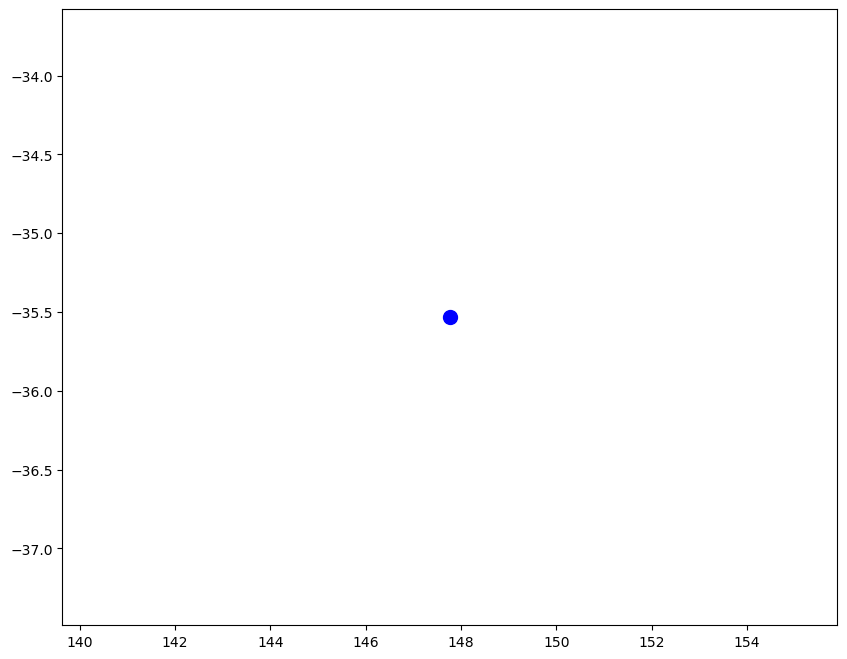

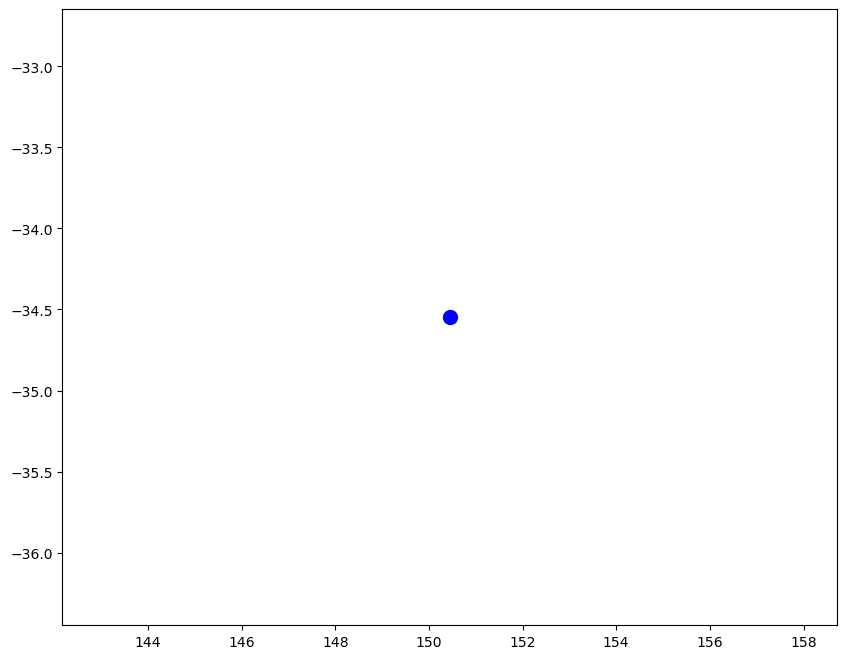

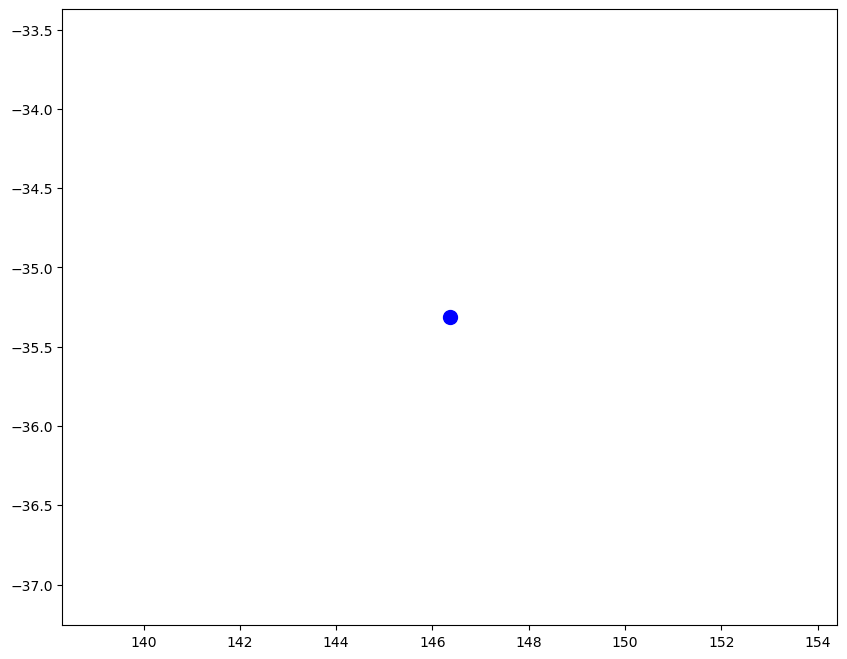

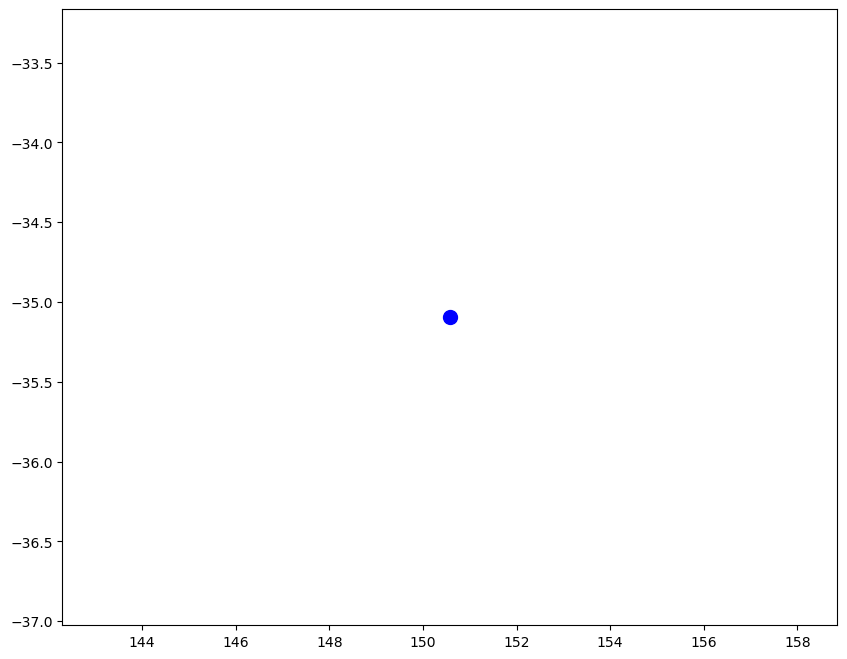

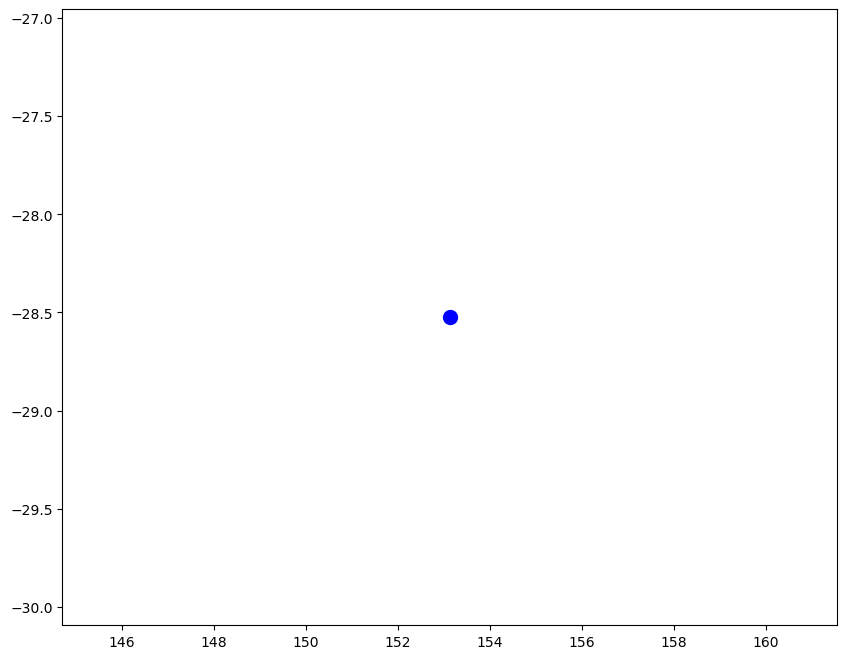

...

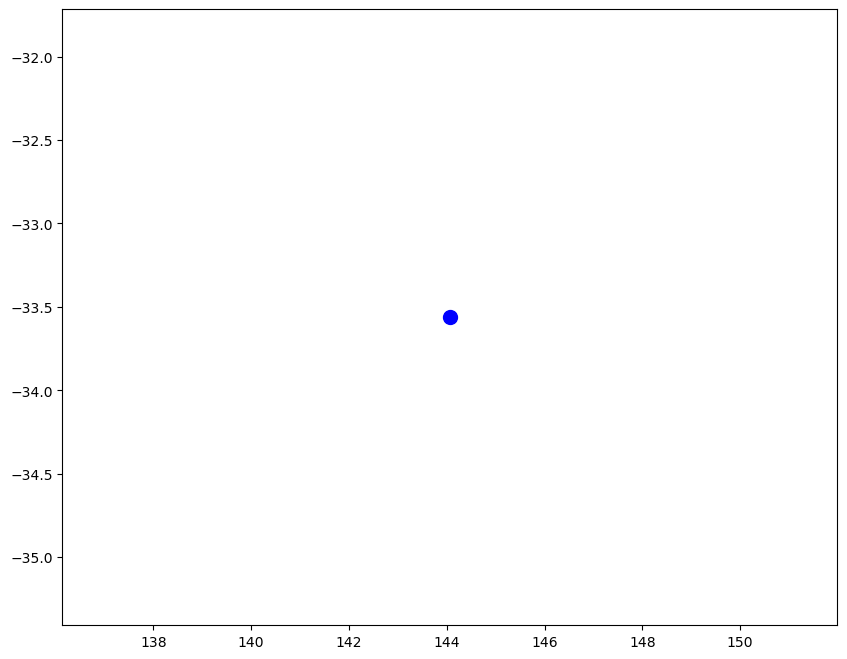

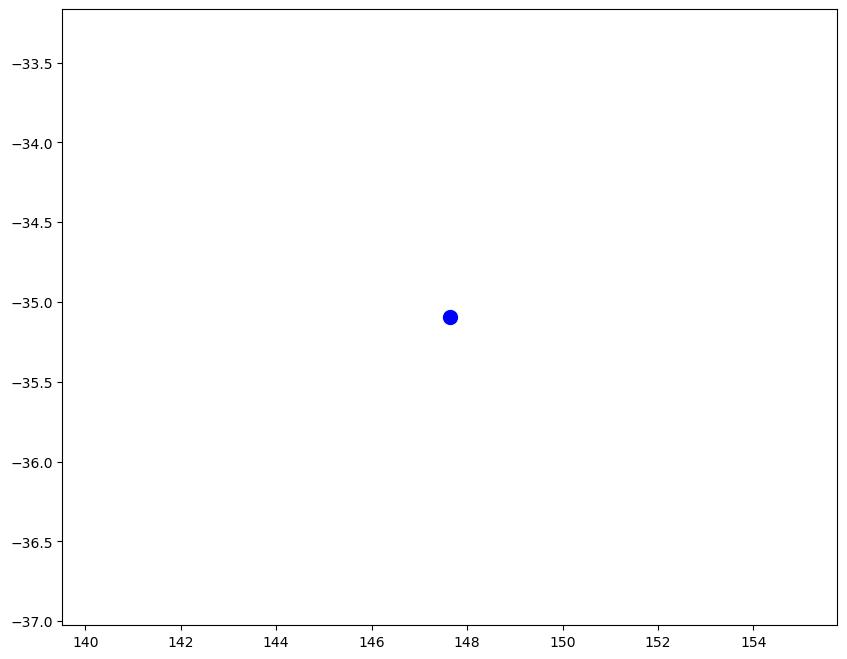

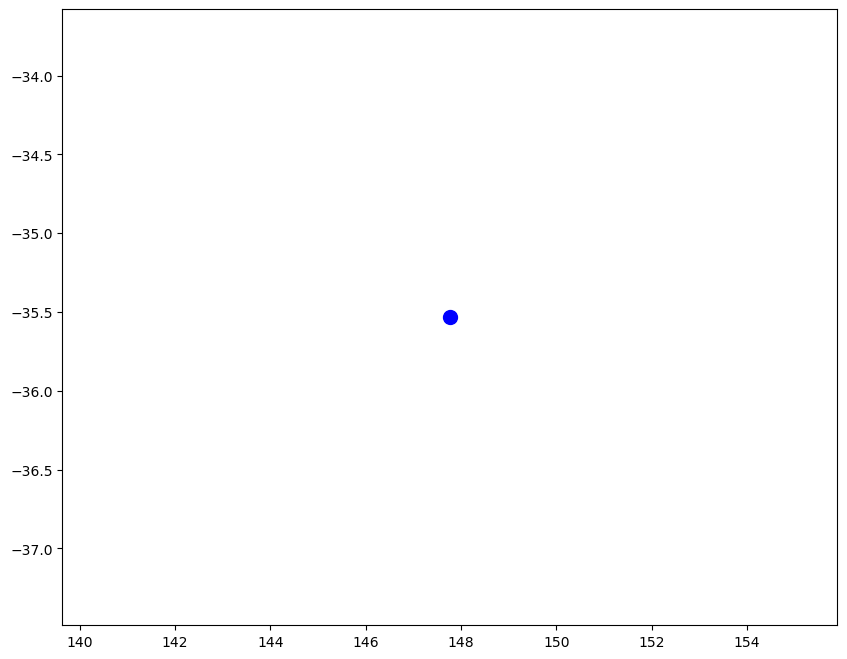

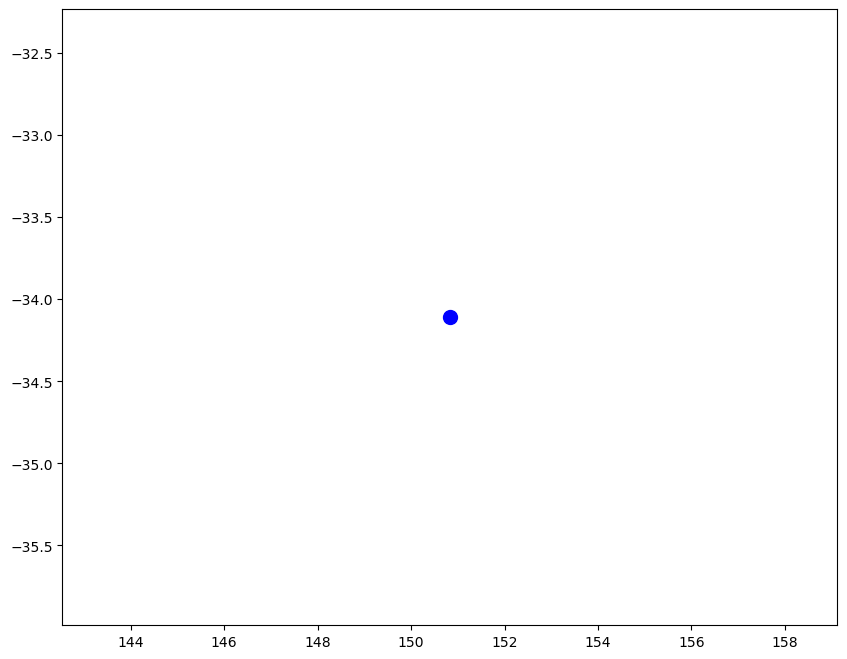

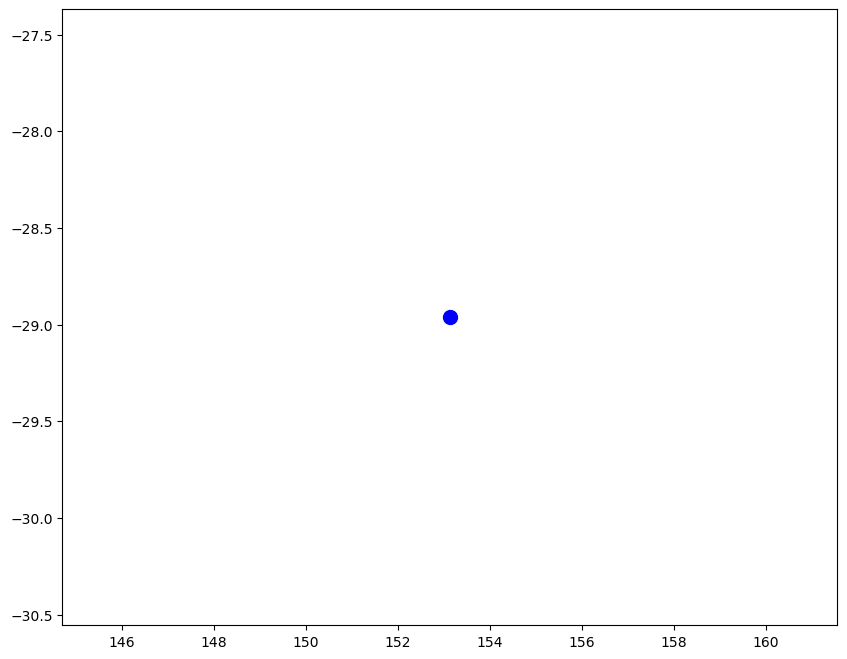

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.stats import gaussian_kde
from scipy.ndimage.filters import maximum_filter
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from scipy.sparse.csgraph import minimum_spanning_tree
import os

# Define paths
excel_file_path = '/Users/coolkarni/Desktop/OneDrive - The University of Melbourne/R1_99_New Events.xlsx'
csv_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/'
output_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_KDE_3Plots/'

# Load event names from the Excel file, skipping NaN values
event_df = pd.read_excel(excel_file_path,sheet_name='Sheet7')
event_names = event_df['Event'].dropna().unique()

# Initialize a list to store names of files that encountered errors
error_files = []

# Set distance threshold (e.g., in degrees, assuming coordinates are in lat/lon)
distance_threshold = 2  # Adjust as needed

# Haversine function to calculate distance between two lat/long coordinates
def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of earth in kilometers
    return c * r

# Function to find the mean rainfall value of the 5 nearest stations
def find_nearest_stations_mean_rainfall(df, lon, lat, column):
    df['distance'] = df.apply(lambda row: haversine(lon, lat, row['Longitude'], row['Latitude']), axis=1)
    nearest_stations = df.nsmallest(5, 'distance')
    mean_rainfall = nearest_stations[column].mean()
    return mean_rainfall

# Process each event
for event_name in event_names:
    # Construct the path to the corresponding CSV file
    csv_file = os.path.join(csv_directory, f"{event_name}.csv")
    
    try:
        # Load the CSV file
        df = pd.read_csv(csv_file)

        # Filter out NaN values in latitude and longitude
        x_cleaned = df[['Latitude', 'Longitude'] + [col for col in df.columns if col.startswith('Rainfall')]].dropna()

        # Read the shapefile (assuming you have this in your directory)
        shapefile_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_shapefile.shp'
        gdf = gpd.read_file(shapefile_path)

        # Create a grid of points within the bounds of the shapefile
        minx, miny, maxx, maxy = gdf.total_bounds
        xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))
        positions = np.vstack([xi.ravel(), yi.ravel()])

        # Initialize lists to store coordinates of maxima and their annotations
        global_maxima_coords = []
        filtered_maxima_coords = []
        annotations = []

        # Iterate through each rainfall column and generate plots
        rainfall_columns = [col for col in x_cleaned.columns if col.startswith('Rainfall')]

        for idx, col in enumerate(rainfall_columns, start=1):
            rainfall = x_cleaned[col]

            # Perform Gaussian KDE on the rainfall data
            values = np.vstack([x_cleaned['Longitude'], x_cleaned['Latitude']])
            kde = gaussian_kde(values, weights=rainfall, bw_method='scott')
            zi = kde(positions).reshape(xi.shape)

            # Mask the grid to include only points inside the shapefile geometry
            points = np.vstack((xi.flatten(), yi.flatten())).T
            mask = np.array([gdf.contains(Point(point)).any() for point in points])
            mask = mask.reshape(xi.shape)
            zi = np.where(mask, zi, np.nan)

            # Find global maximum
            global_max_value = np.nanmax(zi)
            global_max_index = np.unravel_index(np.nanargmax(zi), zi.shape)
            global_max_x = xi[global_max_index]
            global_max_y = yi[global_max_index]

            # Find local maxima (peaks)
            local_max = maximum_filter(zi, size=10) == zi
            peaks = np.where(local_max, zi, np.nan)

            # Calculate 50th percentile value of global maximum
            percentile_90 = 0.5 * global_max_value

            # Remove peaks not within 90th percentile of global maximum
            peaks_filtered = np.where(peaks >= percentile_90, peaks, np.nan)

            # Calculate distances from global maximum to each local maximum
            local_max_coords = np.array(list(zip(xi[np.isfinite(peaks_filtered)], yi[np.isfinite(peaks_filtered)])))
            global_max_coords = np.array([[global_max_x, global_max_y]])
            
            # Check if there are any local maxima
            if local_max_coords.shape[0] > 0:
               # Calculate distances from global maximum to each local maximum
               distances = cdist(global_max_coords, local_max_coords)[0]

               # Apply distance threshold to filter out local maxima too close to the global maximum
               valid_indices = distances > distance_threshold
               filtered_peaks_coords = local_max_coords[valid_indices]
               filtered_peaks_values = peaks_filtered[np.isfinite(peaks_filtered)][valid_indices]

               # Proceed with processing filtered peaks...
               for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                         filtered_maxima_coords.append((x, y))
                         annotations.append((x, y, f'{idx}'))
            else:
              # No local maxima found, skip this chunk
              print("No local maxima found, skipping filtering.")

            # Find mean rainfall value at the global maximum
            global_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, global_max_x, global_max_y, col)

            # Check if global maxima exceeds 25.00 mm threshold
            if global_max_rainfall_mean >= 25.00:
                global_maxima_coords.append((global_max_x, global_max_y))
                annotations.append((global_max_x, global_max_y, f'{idx}'))

                # Store filtered local maxima (peaks) that also exceed 25.00 mm threshold
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))
            else:
                # If global maxima don't exceed threshold, but some local maxima do, plot those
                for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
                    local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
                    if local_max_rainfall_mean >= 25.0:
                        filtered_maxima_coords.append((x, y))
                        annotations.append((x, y, f'{idx}'))

        # Combine global and filtered local maxima coordinates
        all_maxima_coords = np.array(global_maxima_coords + filtered_maxima_coords)

        # Define a small deviation threshold (in degrees)
        deviation_threshold = 0.05  # Adjust as needed

        # Divide the map into longitude sections and count points in each section
        long_sections = [140, 144, 148, 154]  # Define longitude section boundaries
        section_counts = [0] * (len(long_sections) - 1)
        
        # Set to store unique points that are counted
        counted_points = set()

        for lon, lat in all_maxima_coords:
          for i in range(len(long_sections) - 1):
          # Check if the point is within the section range
              if long_sections[i] <= lon < long_sections[i + 1]:
              # Use tuple of coordinates to track unique points
                  if (lon, lat) not in counted_points:
                      counted_points.add((lon, lat))
                      section_counts[i] += 1
                  break  # Exit the loop once the section is found


        # Check if at least two sections satisfy the criteria
        point_threshold = 2
        satisfying_sections = sum(count > point_threshold for count in section_counts)
        perform_clustering = satisfying_sections >= 2

        if perform_clustering:
            # Perform K-means clustering with 2 clusters as a default
            kmeans = KMeans(n_clusters=2, random_state=0)
            cluster_labels = kmeans.fit_predict(all_maxima_coords)

            # Initialize dictionaries to store points for each cluster
            clusters = {label: [] for label in set(cluster_labels)}

            # Sort points into their respective clusters
            for label, point in zip(cluster_labels, all_maxima_coords):
                clusters[label].append(point)

            # Plotting code
            fig, ax = plt.subplots(figsize=(10, 8))
            

            # Function to connect points within each cluster using Minimum Spanning Tree
            def connect_points_within_cluster(points, ax, color):
                if len(points) < 2:
                    return
                # Compute the distance matrix
                distance_matrix = cdist(points, points)
                # Compute the MST using the distance matrix
                mst = minimum_spanning_tree(distance_matrix).toarray()
                # Plot the MST
                for i in range(len(points)):
                    for j in range(len(points)):
                        if mst[i, j] > 0:
                            ax.plot([points[i][0], points[j][0]], [points[i][1], points[j][1]], linestyle='-', color=color, alpha=0.5)

            # Plot points and lines for each cluster
            for label in clusters:
                cluster_points = clusters[label]

                # Choose a color based on the cluster label
                color = 'red' if label == 0 else 'blue'

                # Plot points
                for x, y in cluster_points:
                    ax.plot(x, y, marker='o', color=color, markersize=10)

                # Connect points within the cluster using MST
                connect_points_within_cluster(cluster_points, ax, color)

        else:
            # If no meaningful clusters are found, plot the maxima without clustering
            fig, ax = plt.subplots(figsize=(10, 8))
           
            # Plot points for maxima
            for i, (x, y) in enumerate(all_maxima_coords):
               ax.plot(x, y, marker='o', color='blue', markersize=10)

            # Connect points within the maxima using MST
            connect_points_within_cluster(all_maxima_coords, ax, 'blue')

        # If there's only one maxima point, just plot it
        if len(all_maxima_coords) == 1:
           fig, ax = plt.subplots(figsize=(10, 8))
           
           for x, y in all_maxima_coords:
               ax.plot(x, y, marker='o', color='blue', markersize=10)

        # Annotate points with numbers
        for x, y, label in annotations:
            ax.text(x, y, label, fontsize=10, ha='center', va='bottom', color='black', weight='bold')


        # Save the output plot
        plt.savefig(os.path.join(output_directory, f"{event_name}_output.png"))
        plt.close()

    except Exception as e:
        # Append the event name to the error files list
        error_files.append(event_name)
        print(f"Error processing {event_name}: {e}")

# If there are any error files, save them to the new sheet in the existing Excel file
if error_files:
    # Load the existing data from the specified sheet
    try:
        existing_df = pd.read_excel(excel_file_path, sheet_name='IDW', engine='openpyxl')
    except ValueError:
        # If the sheet doesn't exist, create an empty DataFrame
        existing_df = pd.DataFrame()

    # Create a DataFrame for the new error files
    new_errors_df = pd.DataFrame({'Error Files': error_files})

    # Concatenate the existing data with the new error data
    combined_df = pd.concat([existing_df, new_errors_df], ignore_index=True)

    # Save the combined DataFrame back to the same sheet
    with pd.ExcelWriter(excel_file_path, mode='a', engine='openpyxl') as writer:
        combined_df.to_excel(writer, sheet_name='IDW', index=False)
print("Processing complete. Check the output directory for results and the Excel file for any errors.")
